# Fine plotting of case study 

In [7]:
library("dplyr")
library("readr")
library("ggplot2")
library("purrr")
library("stringr")
library("tidyr")
library("susiF.alpha")


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [69]:
gene_name = read_delim("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/../reference_data/Homo_sapiens.GRCh38.103.chr.reformatted.collapse_only.gene.region_list")
gene_body = read_delim("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/../reference_data/Homo_sapiens.GRCh38.103.chr.reformatted.collapse_only.gene.ERCC.gtf",col_names = F, skip = 1)


Rows: 60726 Columns: 5
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (3): #chr, gene_id, gene_name
dbl (2): start, end

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 481312 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (7): X1, X2, X3, X6, X7, X8, X9
dbl (2): X4, X5

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [17]:
options(repr.plot.width =30, repr.plot.height = 20)

In [5]:
color = c("black", "dodgerblue2", "green4", "#6A3D9A",
      "#FF7F00", "gold1", "skyblue2", "#FB9A99", "palegreen2",
      "#CAB2D6", "#FDBF6F", "gray70", "khaki2", "maroon", "orchid1",
      "deeppink1", "blue1", "steelblue4", "darkturquoise", "green1",
      "yellow4", "yellow3","darkorange4","brown","navyblue","#FF0000",
      "darkgreen","#FFFF00","purple","#00FF00","pink","#0000FF",
      "orange","#FF00FF","cyan","#00FFFF","#FFFFFF")
plot_range = c(32600000,34360000)

 ## Define Function
    update_cal_credible_band2 <- function(susiF.obj )
    {
    
    
    
      if(sum( is.na(unlist(susiF.obj$alpha))))
      {
        stop("Error: some alpha value not updated, please update alpha value first")
      }
      temp <- wavethresh::wd(rep(0, susiF.obj$n_wac))
    
    
      for ( l in 1:susiF.obj$L)
      {
        Smat <-  susiF.obj$fitted_wc2[[l]]
        W1   <- ((wavethresh::GenW(n=  ncol(Smat )  , filter.number = 10, family = "DaubLeAsymm")))
        tt   <- diag( W1%*%diag(c(susiF.obj$alpha[[l]]%*%Smat ))%*% t(W1 ))
    
        up                       <-  susiF.obj$fitted_func[[l]]+ 3*sqrt(tt)
        low                      <-  susiF.obj$fitted_func[[l]]- 3*sqrt(tt)
        susiF.obj$cred_band[[l]] <- rbind(up, low)
      }
    for (i in 1:susiF.obj$L){
    rownames(susiF.obj$cred_band[[i]]) = paste0("Effect_",i,":",rownames(susiF.obj$cred_band[[i]]))

    }
    
    
      return(susiF.obj)
    }


effect_extract_df = function(fsusie,n = 1:length(fsusie$fitted_func) ){
    color = c("black", "dodgerblue2", "green4", "#6A3D9A",
      "#FF7F00", "gold1", "skyblue2", "#FB9A99", "palegreen2",
      "#CAB2D6", "#FDBF6F", "gray70", "khaki2", "maroon", "orchid1",
      "deeppink1", "blue1", "steelblue4", "darkturquoise", "green1",
      "yellow4", "yellow3","darkorange4","brown","navyblue","#FF0000",
      "darkgreen","#FFFF00","purple","#00FF00","pink","#0000FF",
      "orange","#FF00FF","cyan","#00FFFF","#FFFFFF")
     plot_df = ((fsusie$fitted_func[n])%>%as_tibble(.name_repair = "universal")%>%mutate(pos =  fsusie$outing_grid)%>%`colnames<-`(c(paste0("Effect_",n,":mid"),"pos"))%>%mutate(`#chr` = str_split(names(fsusie$csd_X)[[1]],":")[[1]][[1]] ))%>%dplyr::select(`#chr`, pos, everything())
    plot_df = cbind(plot_df ,t(Reduce(rbind,fsusie$cred_band[n]))  )
    plot_df = plot_df%>%pivot_longer(cols = 3:ncol(plot_df), names_to = c("effect",".value"),names_prefix = "" , names_sep = ":") 
     return(plot_df)
     }
plot_effect = function(plot_df){
plot = plot_df%>%arrange(-abs(mid))%>%group_by(effect)%>%ggplot(linewidth = 7)+
     geom_line(aes(x = pos, y = mid,color = effect))+geom_ribbon(aes(x = pos, y = mid,ymin = low, ymax = up,fill = effect), alpha = 0.2)+
         ylab("Estimated Effect") + xlab("POS")+geom_hline(aes(yintercept = 0), color = "black")+theme_bw()+
         xlab("") + facet_grid(effect ~.)+scale_color_manual("Credible set",values = color)+
         ylab("Estimated Effect")+ scale_fill_manual("Credible set",values = color)+
         theme(text = element_text(size = 40))+  theme(plot.margin=unit(c(5,0,0,0),"mm"), strip.text.y.right = element_text(angle = 0,size = 20),axis.text.y = element_text(size = 25))
return(plot)
}

In [97]:
## Define Function
    update_cal_credible_band2 <- function(susiF.obj )
    {
    for (i in 1:susiF.obj$L){
    rownames(susiF.obj$cred_band[[i]]) = paste0("Effect_",i,":",rownames(susiF.obj$cred_band[[i]]))

    }
    
      return(susiF.obj)
    }

In [7]:
color = c("black", "dodgerblue2", "green4", "#6A3D9A",
      "#FF7F00", "gold1", "skyblue2", "#FB9A99", "palegreen2",
      "#CAB2D6", "#FDBF6F", "gray70", "khaki2", "maroon", "orchid1",
      "deeppink1", "blue1", "steelblue4", "darkturquoise", "green1",
      "yellow4", "yellow3","darkorange4","brown","navyblue","#FF0000",
      "darkgreen","#FFFF00","purple","#00FF00","pink","#0000FF",
      "orange","#FF00FF","cyan","#00FFFF","#FFFFFF")
extract_table = function(variant_df,type){
if("purity" %in% colnames(variant_df) ){
  variant_df$purity[is.na(variant_df$purity)] = 0
  variant_df[abs(variant_df$purity) < 0.5,7] = 0
  }
 variant_df = variant_df%>%mutate(CS = (cs_order%>%as.factor%>%as.numeric-1)%>%as.factor)%>%
      dplyr::select( y = pip ,snp = variants,pos = position , CS, molecular_trait_id)%>%mutate(molecular_trait_id = paste0(type,"_",molecular_trait_id ) )
return(variant_df)
}


In [315]:
susiF_obj_me =   readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/definitive_mQTL/meQTL.yuqi_mqtl.tad185.uni_Fsusie.mixture_normal_per_scale.rds")
genotype_me= readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/rerun/cache//fsusie.yuqi_mqtl.tad185.uni_Fsusie.mixture_normal_per_scale.rds")
susiF_obj_me$input_data = genotype_me$input_data
susiF_obj_ha =   readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/definitive_haQTL/haQTL.rosmap_haqtl.tad185.uni_Fsusie.mixture_normal_per_scale.rds")
genotype_ha= readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/rerun/cache//fsusie.rosmap_haqtl.tad185.uni_Fsusie.mixture_normal_per_scale.rds")
susiF_obj_ha$input_data = genotype_ha$input_data
list(haQTL = susiF_obj_ha, mQTL =  susiF_obj_me)%>%saveRDS("4_tad185_rawdata.rds")


In [316]:
susiF_obj_me =   readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/definitive_mQTL/meQTL.yuqi_mqtl.tad1411.uni_Fsusie.mixture_normal_per_scale.rds")
genotype_me= readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/rerun/cache//fsusie.yuqi_mqtl.tad1411.uni_Fsusie.mixture_normal_per_scale.rds")
susiF_obj_me$input_data = genotype_me$input_data
susiF_obj_ha =   readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/definitive_haQTL/haQTL.rosmap_haqtl.tad1411.uni_Fsusie.mixture_normal_per_scale.rds")
genotype_ha= readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/rerun/cache//fsusie.rosmap_haqtl.tad1411.uni_Fsusie.mixture_normal_per_scale.rds")
susiF_obj_ha$input_data = genotype_ha$input_data
list(haQTL = susiF_obj_ha, mQTL =  susiF_obj_me)%>%saveRDS("4_tad1411_rawdata.rds")


In [317]:
susiF_obj_me =   readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/definitive_mQTL/meQTL.yuqi_mqtl.tad75.uni_Fsusie.mixture_normal_per_scale.rds")
genotype_me= readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/rerun/cache//fsusie.yuqi_mqtl.tad75.uni_Fsusie.mixture_normal_per_scale.rds")
susiF_obj_me$input_data = genotype_me$input_data
susiF_obj_ha =   readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/definitive_haQTL/haQTL.rosmap_haqtl.tad75.uni_Fsusie.mixture_normal_per_scale.rds")
genotype_ha= readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/rerun/cache//fsusie.rosmap_haqtl.tad75.uni_Fsusie.mixture_normal_per_scale.rds")
susiF_obj_ha$input_data = genotype_ha$input_data
list(haQTL = susiF_obj_ha, mQTL =  susiF_obj_me)%>%saveRDS("4_tad75_rawdata.rds")


In [318]:
susiF_obj_me =   readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/definitive_mQTL/meQTL.yuqi_mqtl.tad426.uni_Fsusie.mixture_normal_per_scale.rds")
genotype_me= readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/rerun/cache//fsusie.yuqi_mqtl.tad426.uni_Fsusie.mixture_normal_per_scale.rds")
susiF_obj_me$input_data = genotype_me$input_data
susiF_obj_ha =   readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/definitive_haQTL/haQTL.rosmap_haqtl.tad426.uni_Fsusie.mixture_normal_per_scale.rds")
genotype_ha= readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/rerun/cache//fsusie.rosmap_haqtl.tad426.uni_Fsusie.mixture_normal_per_scale.rds")
susiF_obj_ha$input_data = genotype_ha$input_data
list(haQTL = susiF_obj_ha, mQTL =  susiF_obj_me)%>%saveRDS("4_tad426_rawdata.rds")


In [ ]:
susiF_obj_me =   readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/definitive_mQTL/meQTL.yuqi_mqtl.tad174.uni_Fsusie.mixture_normal_per_scale.rds")
genotype_me= readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/rerun/cache//fsusie.yuqi_mqtl.tad174.uni_Fsusie.mixture_normal_per_scale.rds")
susiF_obj_me$input_data = genotype_me$input_data
susiF_obj_ha =   readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/definitive_haQTL/haQTL.rosmap_haqtl.tad174.uni_Fsusie.mixture_normal_per_scale.rds")
genotype_ha= readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/rerun/cache//fsusie.rosmap_haqtl.tad174.uni_Fsusie.mixture_normal_per_scale.rds")
susiF_obj_ha$input_data = genotype_ha$input_data
list(haQTL = susiF_obj_ha, mQTL =  susiF_obj_me)%>%saveRDS("4_tad174_rawdata.rds")

## tad185

In [25]:
tad = "tad185"

In [26]:
pipplot = readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/superfine/pQTL_eQTL_haQTL_mQTL.2_FBLN7_Q53RD9.pip_landscape_plot.rds")

In [27]:
susiF_obj_me =   readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/definitive_mQTL/meQTL.yuqi_mqtl.tad185.uni_Fsusie.mixture_normal_per_scale.rds")


In [170]:
susiF_obj_me = update_cal_credible_band2(susiF_obj_me)

In [ ]:

susiF_obj_ha =  readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/definitive_haQTL/haQTL.rosmap_haqtl.tad185.uni_Fsusie.mixture_normal_per_scale.rds")


In [172]:
susiF_obj_ha = update_cal_credible_band2(susiF_obj_ha)

In [154]:
plot_range = c(min(pipplot[[2]]$pos),max(pipplot[[2]]$pos))
pipplot[[2]]%>%ggplot2::ggplot(aes(y = y, x = pos,
                              col =  as.factor(CS), shape = Shared )) + facet_grid(molecular_trait_id ~.)+
  geom_point(size = 7) +
  scale_color_manual("CS",values = color) +theme_bw()+
  theme(axis.ticks.x = element_blank()) +
 ylab("Posterior Inclusion Probability (PIP)")+
  theme(axis.ticks.x = element_blank()) +
        theme(strip.text.y.right = element_text(angle = 0))+
        xlab("") +
        theme(text = element_text(size = 30))-> refine_pip_plot

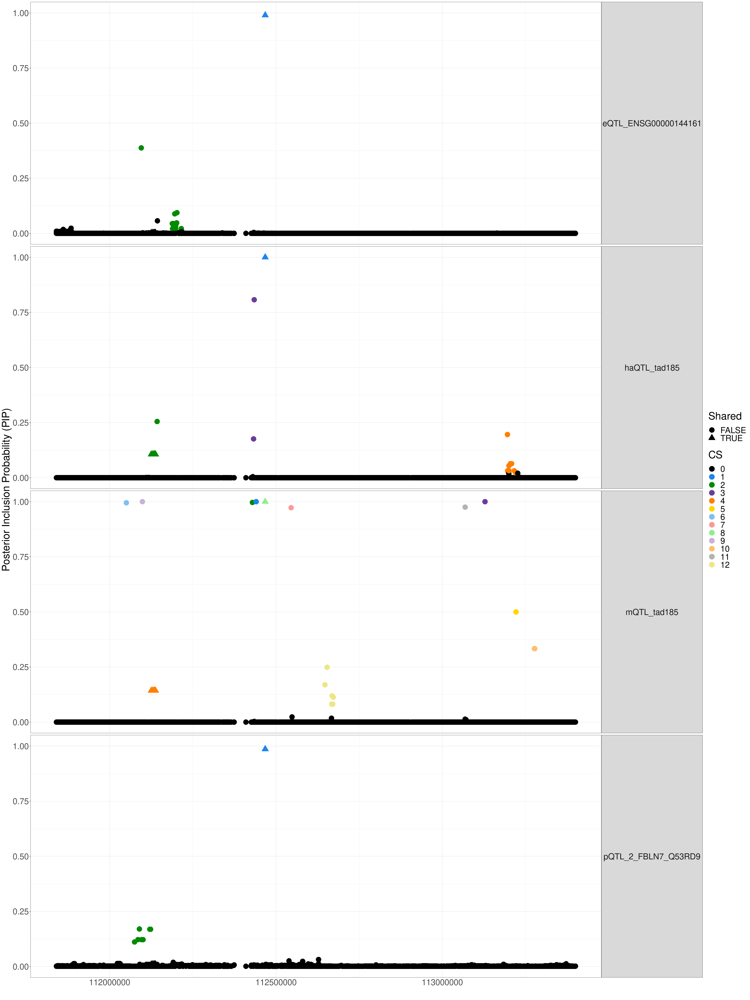

In [155]:
refine_pip_plot

In [168]:
susiF_obj_ha$cs

[[1]]
chr14:49741313_ATT_TTT 
                   314 

[[2]]
        chr14:50391894_C_T         chr14:50396206_A_G 
                      2032                       2052 
chr14:50396210_AAAAG_GAAAG 
                      2053 

[[3]]
       chr14:50337833_A_C        chr14:50339522_A_G        chr14:50336640_A_C 
                     1879                      1882                      1875 
       chr14:50337871_G_C        chr14:50336009_A_C       chr14:50336863_T_TA 
                     1880                      1872                      1877 
       chr14:50340005_G_A        chr14:50336122_A_G        chr14:50314997_C_T 
                     1884                      1873                      1802 
       chr14:50323179_A_G        chr14:50319944_C_T        chr14:50322860_G_C 
                     1829                      1817                      1828 
       chr14:50323234_C_T        chr14:50327096_G_A        chr14:50328459_C_T 
                     1830                      1839                      1842 
       chr14:50328772_G_A        chr14:50314206_T_C        chr14:50316702_A_G 
                     1843                      1801                      1808 
       chr14:50317527_G_A        chr14:50325555_A_G        chr14:50322323_C_T 
                     1813                      1835                      1825 
       chr14:50315619_G_A        chr14:50319286_A_G        chr14:50316803_G_A 
                     1804                      1816                      1809 
       chr14:50321495_C_T        chr14:50316047_A_T        chr14:50312511_C_T 
                     1823                      1806                      1794 
       chr14:50314159_C_A        chr14:50317052_T_C   chr14:50327334_CAAA_CAA 
                     1800                      1810                      1840 
       chr14:50318412_T_G chr14:50320275_A_ATTTTTAT        chr14:50320136_C_G 
                     1815                      1821                      1819 
       chr14:50312098_A_C 
                     1793

In [174]:
 output_ha = effect_extract_df(susiF_obj_ha,n = c(1)) 
output_me = effect_extract_df(susiF_obj_me,n = c(8))

New names:
• `` -> `...1`
New names:
• `` -> `...1`


In [165]:
output_ha$pos

[1] 49615836 49621583 49638245 49650728 49664751 49667424 49670096 49672769
  [9] 49675441 49685951 49691415 49693064 49694714 49696363 49698012 49699661
 [17] 49701310 49705620 49728650 49730309 49731968 49733626 49735285 49736944
 [25] 49738602 49740261 49745384 49778927 49796023 49800959 49808308 49832965
 [33] 49835477 49837989 49840501 49843014 49859554 49864871 49870316 49877727
 [41] 49885790 49895194 49910477 49913783 49917088 49920394 49927202 49939068
 [49] 49961962 49965109 49968256 49971402 49986626 49997305 50011432 50012626
 [57] 50013821 50015015 50016210 50017405 50018599 50019794 50020988 50022183
 [65] 50023378 50036453 50038348 50039870 50041392 50042914 50044436 50045957
 [73] 50047479 50049001 50059351 50094874 50116113 50158149 50182234 50191877
 [81] 50195631 50199385 50203140 50208174 50213499 50218789 50224027 50229266
 [89] 50232010 50234625 50237240 50239854 50242730 50252292 50269328 50302607
 [97] 50329195 50335774 50340086 50344398 50364184 50372506 50376850 50381194
[105] 50389443 50428591 50466450 50475822 50484400 50499464 50508661 50513795
[113] 50516484 50519172 50521860 50524549 50532671 50544957 50559559 50581942
[121] 50592433 50629125 50673776 50699879 50735351 50761535 50773259 50813762

In [175]:
refine_effect_plot =  rbind(output_me,output_ha)%>%group_by(effect)%>%ggplot(linewidth = 7)+
     geom_line(aes(x = pos, y = mid,color = effect))+geom_ribbon(aes(x = pos, y = mid,ymin = low, ymax = up,fill = effect), alpha = 0.2)+
         ylab("Estimated Effect") + xlab("POS")+geom_hline(aes(yintercept = 0), color = "black")+theme_bw()+
         xlab("") + facet_grid(effect ~.)+scale_color_manual("Credible set",values = color[c(1,8)+1])+
         ylab("Estimated Effect")+ scale_fill_manual("Credible set",values = color[c(1,8)+1])+
         theme(text = element_text(size = 40))+  theme(plot.margin=unit(c(5,0,0,0),"mm"), strip.text.y.right = element_text(angle = 0,size = 20),axis.text.x = element_blank(),axis.text.y = element_text(size = 25))

In [158]:
gene_body_filter = gene_body%>%filter(X4 %in% seq(plot_range[1],plot_range[2]) , X5%in% seq(plot_range[1],plot_range[2])   ,X3 =="gene")%>%mutate(gene_id = read.table(text = X9,,sep = "\"")$V2,
                                                                                                    gene_name = read.table(text = X9,,sep = "\"")$V8 ,
                                                                                                   gene_type  = read.table(text = X9,,sep = "\"")$V6 )

In [159]:
gene_name_filter = gene_body_filter%>%select("#chr" = X1, strand = X7, start = X4,end = X5, gene_id,gene_name,gene_type)

In [160]:
switch_end = gene_name_filter[gene_name_filter$strand == "-",4]
gene_name_filter[gene_name_filter$strand == "-",4] = gene_name_filter[gene_name_filter$strand == "-",3]
gene_name_filter[gene_name_filter$strand == "-",3] = switch_end

In [189]:
gene_name_filter%>%filter( gene_name == "FBLN7" | gene_id == "ENSG00000144161")%>%
ggplot(aes()) + geom_segment( aes(x = start,xend = end, y = strand, yend = strand ) , arrow = arrow(length = unit(0.5, "cm")) )+theme_bw()+
geom_label(aes(x = (start),y = "", label = gene_name ), position = position_dodge(width = 1),size = 10)+xlab("")+facet_grid(gene_type~.)+
theme(legend.position="none")+theme(text = element_text(size = 40))+xlim(plot_range)+geom_point(aes(x = start, y = ""), color = "black",size = 3  ) -> gene_plot

In [181]:
gene_name_filter%>%filter(gene_type == "protein_coding", gene_name == "FBLN7")

#chr,strand,start,end,gene_id,gene_name,gene_type
<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
chr2,+,112138385,112188218,ENSG00000144152,FBLN7,protein_coding


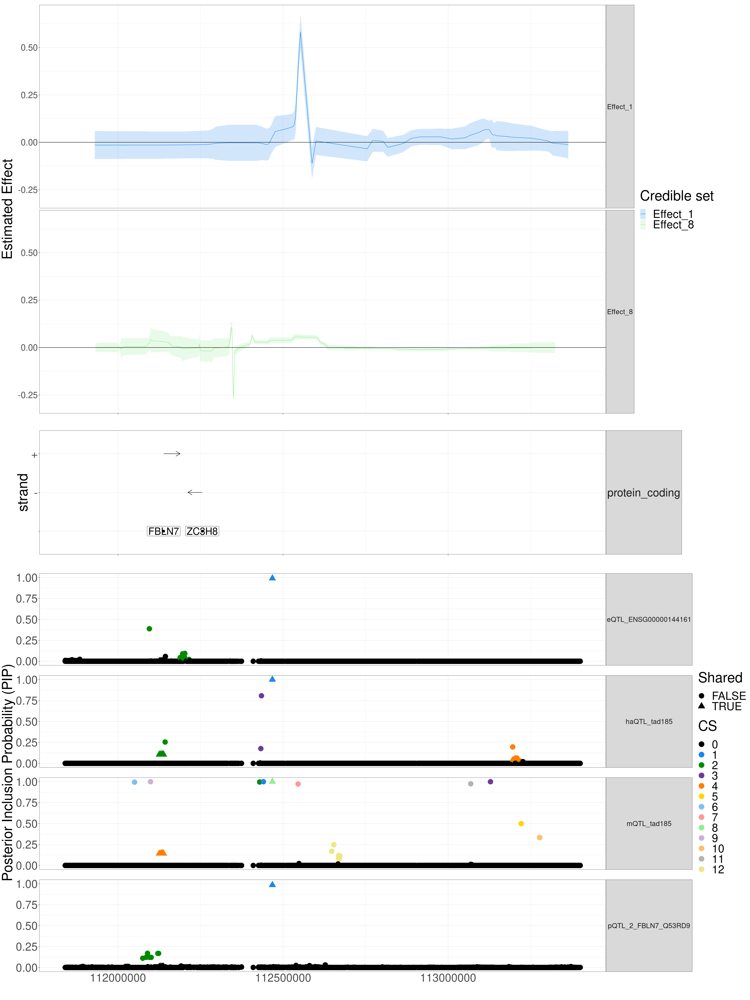

In [190]:
cowplot::plot_grid(plotlist = list(refine_effect_plot+ xlim(plot_range),
                                    gene_plot+theme_bw()+theme(axis.text.x = element_blank()) + theme(strip.text.y.right = element_text(angle = 0))+ xlab("") +theme(text = element_text(size = 40)),
                                   refine_pip_plot+theme_bw()+theme(axis.ticks.x = element_blank()) + theme(strip.text.y.right = element_text(angle = 0,size = 20))+ xlab("") +theme(text = element_text(size = 40),panel.spacing=unit(2, "lines"))
                                  ) ,ncol = 1, align = "v",axis = "tlbr",rel_heights = c(6,2,6))


## tad1411

In [28]:
tad = "tad1411"
pipplot = readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/superfine/pQTL_eQTL_haQTL_mQTL.22_APOL2_Q9BQE5.pip_landscape_plot.rds")


In [113]:
pipplot = readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/superfine/pQTL_eQTL_haQTL_mQTL.22_APOL2_Q9BQE5.pip_landscape_plot.rds")

In [29]:
Robjec_path = paste0(tad,".RData")

In [30]:
Rda = attach(Robjec_path)

The following object is masked from file:tad1411.RData (pos = 3):

    a


The following object is masked from file:tad1411.RData (pos = 4):

    a




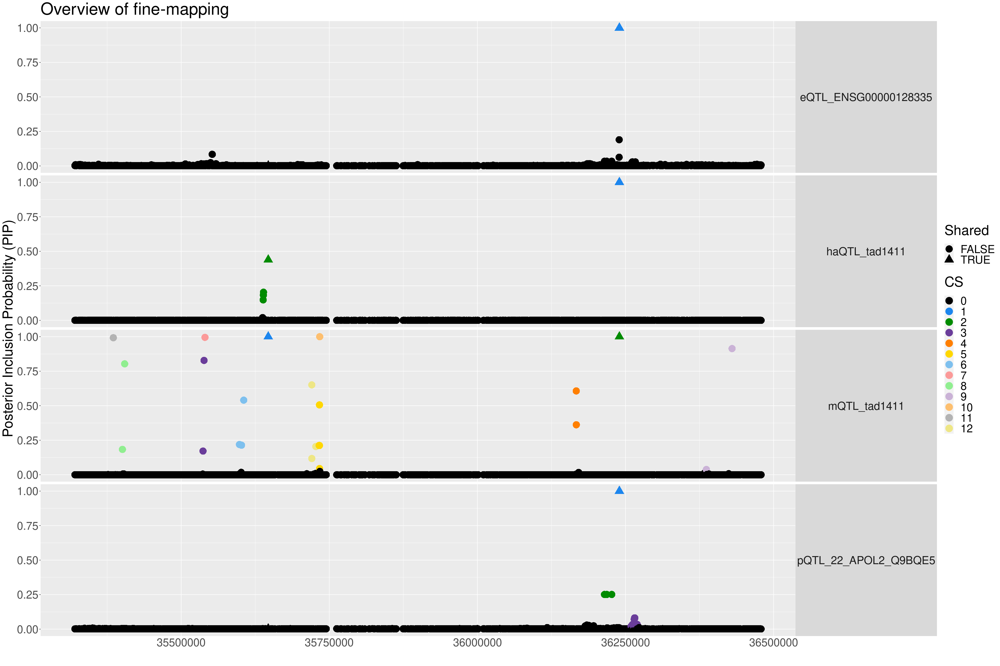

In [114]:
pipplot[[1]]

In [115]:
susiF_obj_me =   Rda$a$mQTL


In [116]:
susiF_obj_me = update_cal_credible_band2(susiF_obj_me)

In [117]:

susiF_obj_ha =  Rda$a$haQTL

In [118]:
susiF_obj_ha = update_cal_credible_band2(susiF_obj_ha)

In [112]:
(susiF_obj_ha$cs)

[[1]]
chr22:36239710_G_A 
              2350 

[[2]]
chr22:35646939_C_T chr22:35638936_T_C chr22:35638771_G_A chr22:35638396_C_G 
              1054               1015               1014               1013

In [35]:
gene_name

ERROR: Error in eval(expr, envir, enclos): object 'gene_name' not found


In [131]:
pipplot[[2]]%>%mutate(new_CS = case_when(str_detect(molecular_trait_id,"mQTL" )& CS == 2 ~  1,
                                    str_detect(molecular_trait_id,"mQTL" ) & CS == 1 ~  2,
                                    .default = as.numeric(CS)-1 
                                   ), molecular_trait_id = str_replace(molecular_trait_id,"ENSG00000128335","APOL2")) -> plot_df_2

In [122]:
gene_name%>%filter(gene_id == "ENSG00000128335")

#chr,start,end,gene_id,gene_name
<chr>,<dbl>,<dbl>,<chr>,<chr>
chr22,36239953,36239954,ENSG00000128335,APOL2


In [132]:
plot_df_2%>%filter(Shared)

y,snp,pos,CS,molecular_trait_id,Shared,new_CS
<dbl>,<chr>,<dbl>,<fct>,<chr>,<lgl>,<dbl>
0.002996106,chr22:35646939_C_T,35646939,0,pQTL_22_APOL2_Q9BQE5,TRUE,0
1.000000000,chr22:36239710_G_A,36239710,1,pQTL_22_APOL2_Q9BQE5,TRUE,1
0.001491324,chr22:35646939_C_T,35646939,0,eQTL_APOL2,TRUE,0
1.000000000,chr22:36239710_G_A,36239710,1,eQTL_APOL2,TRUE,1
0.438675762,chr22:35646939_C_T,35646939,2,haQTL_tad1411,TRUE,2
1.000000000,chr22:36239710_G_A,36239710,1,haQTL_tad1411,TRUE,1
1.000000000,chr22:35646939_C_T,35646939,1,mQTL_tad1411,TRUE,2
1.000000000,chr22:36239710_G_A,36239710,2,mQTL_tad1411,TRUE,1


In [133]:
plot_range = c(min(pipplot[[2]]$pos),max(pipplot[[2]]$pos))
plot_df_2%>%ggplot2::ggplot(aes(y = y, x = pos,
                              col =  as.factor(new_CS), shape = Shared )) + facet_grid(molecular_trait_id ~.)+
  geom_point(size = 7) +
  scale_color_manual("CS",values = color) +theme_bw()+
  theme(axis.ticks.x = element_blank()) +
 ylab("Posterior Inclusion Probability (PIP)")+
  theme(axis.ticks.x = element_blank()) +
        theme(strip.text.y.right = element_text(angle = 0))+
        xlab("") +
        theme(text = element_text(size = 30))-> refine_pip_plot

In [147]:
plot_df_2%>%write_delim(paste0("4_",tad,"pip_superfine.tsv"),"\t")

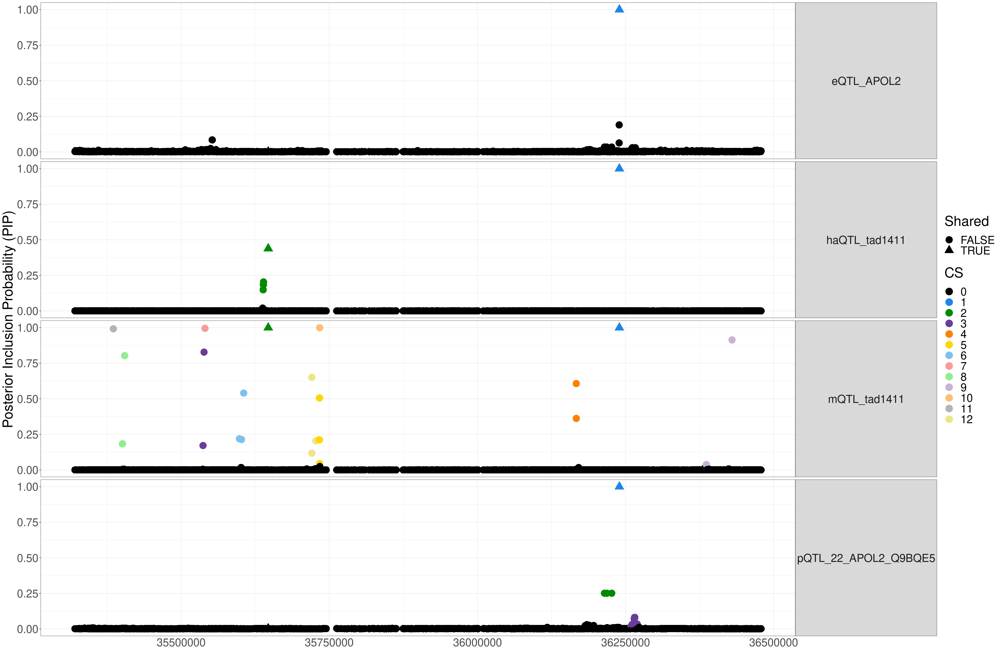

In [134]:
refine_pip_plot

In [200]:
susiF_obj_ha$cs

[[1]]
chr22:36239710_G_A 
              2350 

[[2]]
chr22:35646939_C_T chr22:35638936_T_C chr22:35638771_G_A chr22:35638396_C_G 
              1054               1015               1014               1013

In [81]:
which.max = function(m,x){m[which(x == max(x))] }

In [140]:
plot_df_2%>%filter(Shared,new_CS != 0 )%>%count(molecular_trait_id,CS)%>%count(CS)

CS,n
<fct>,<int>
1,4
2,2


In [139]:
output_ha = effect_extract_df(susiF_obj_ha,n = c(1)) 
output_me = effect_extract_df(susiF_obj_me,n = c(2))

New names:
• `` -> `...1`
New names:
• `` -> `...1`


In [150]:
mapper = c("Effect_1"  =   "Effect_2" ,
"Effect_2"  =   "Effect_1" )
output_me = output_me%>%mutate(effect = map_chr(effect,~names(mapper[which(mapper == .x)])))
output_me = output_me%>%mutate(type = paste0("mQTL_" , effect ))
output_ha = output_ha%>%mutate(type = paste0( "haQTL_",effect ))

In [154]:
refine_effect_plot =  rbind(output_me,output_ha)%>%group_by(effect)%>%ggplot(linewidth = 7)+
     geom_line(aes(x = pos, y = mid,color = effect))+geom_ribbon(aes(x = pos, y = mid,ymin = low, ymax = up,fill = effect), alpha = 0.2)+
         ylab("Estimated Effect") + xlab("POS")+geom_hline(aes(yintercept = 0), color = "black")+theme_bw()+
         xlab("") + facet_grid(type ~.)+scale_color_manual("Credible set",values = color[c(1,2)+1])+
         ylab("Estimated Effect")+ scale_fill_manual("Credible set",values = color[c(1,8)+1])+
         theme(text = element_text(size = 40))+  theme(plot.margin=unit(c(5,0,0,0),"mm"), strip.text.y.right = element_text(angle = 0,size = 20),axis.text.x = element_blank(),axis.text.y = element_text(size = 25))

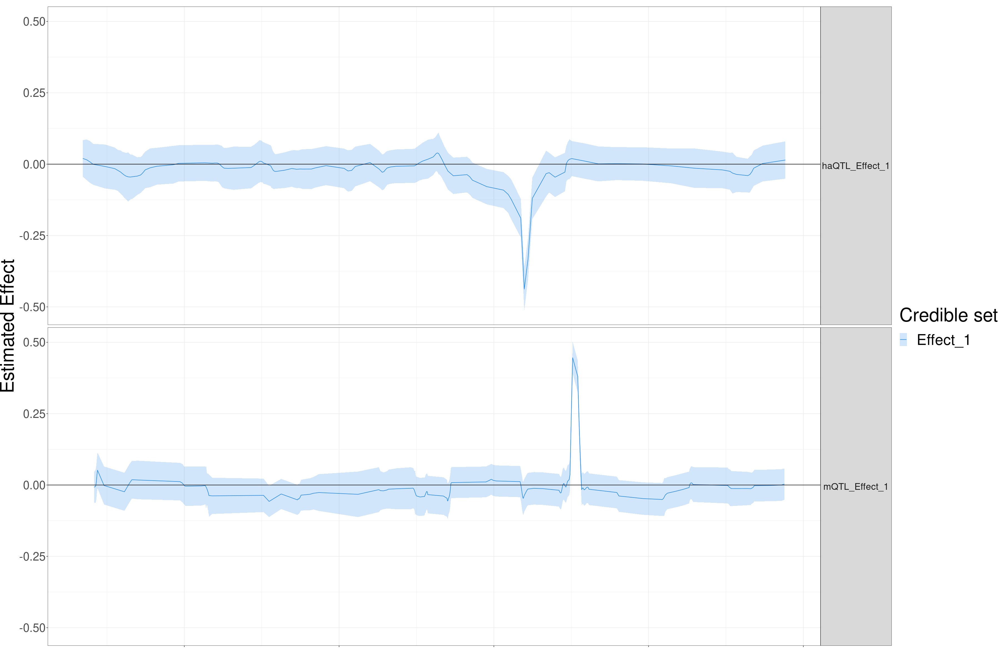

In [155]:
refine_effect_plot

In [141]:
gene_body_filter = gene_body%>%filter(X4 %in% seq(plot_range[1],plot_range[2]) , X5%in% seq(plot_range[1],plot_range[2])   ,X3 =="gene")%>%mutate(gene_id = read.table(text = X9,,sep = "\"")$V2,
                                                                                                    gene_name = read.table(text = X9,,sep = "\"")$V8 ,
                                                                                                   gene_type  = read.table(text = X9,,sep = "\"")$V6 )

In [142]:
gene_name_filter = gene_body_filter%>%select("#chr" = X1, strand = X7, start = X4,end = X5, gene_id,gene_name,gene_type)

In [143]:
switch_end = gene_name_filter[gene_name_filter$strand == "-",4]
gene_name_filter[gene_name_filter$strand == "-",4] = gene_name_filter[gene_name_filter$strand == "-",3]
gene_name_filter[gene_name_filter$strand == "-",3] = switch_end

In [144]:
gene_name_filter%>%filter( gene_name == "APOL2" | gene_id == "ENSG00000128335")%>%
ggplot(aes()) + geom_segment( aes(x = start,xend = end, y = strand, yend = strand ) , arrow = arrow(length = unit(0.5, "cm")) )+theme_bw()+
geom_label(aes(x = (start),y = "", label = gene_name ), position = position_dodge(width = 1),size = 10)+xlab("")+facet_grid(gene_type~.)+
theme(legend.position="none")+theme(text = element_text(size = 40))+xlim(plot_range)+geom_point(aes(x = start, y = ""), color = "black",size = 3  ) -> gene_plot

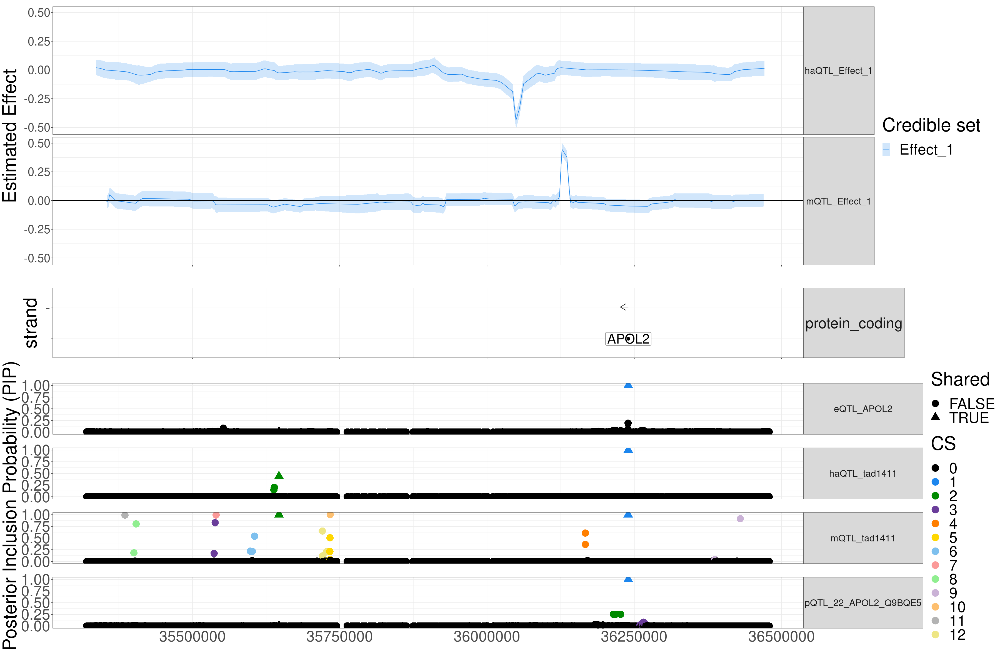

In [ ]:
cowplot::plot_grid(plotlist = list(refine_effect_plot+ xlim(plot_range),
                                    gene_plot+theme_bw()+theme(axis.text.x = element_blank()) + theme(strip.text.y.right = element_text(angle = 0))+ xlab("") +theme(text = element_text(size = 40)),
                                   refine_pip_plot+theme_bw()+theme(axis.ticks.x = element_blank()) + theme(strip.text.y.right = element_text(angle = 0,size = 20))+ xlab("") +theme(text = element_text(size = 40),panel.spacing=unit(2, "lines"))
                                  ) ,ncol = 1, align = "v",axis = "tlbr",rel_heights = c(6,2,6))


In [156]:
gene_name_filter%>%write_delim(paste0("4_",tad,"gene_info.tsv"),"\t")
plot_df_2%>%write_delim(paste0("4_",tad,"pip_superfine.tsv"),"\t")
rbind(output_me,output_ha)%>%write_delim(paste0("4_",tad,"effect_superfine.tsv"),"\t")

## 75

In [158]:
tad = "tad75"
pipplot = readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/superfine/pQTL_eQTL_haQTL_mQTL.1_TSTD1_Q8NFU3.pip_landscape_plot.rds")


In [159]:
Robjec_path = paste0(tad,".RData")

In [160]:
Rda = attach(Robjec_path)

The following object is masked from file:tad1411.RData (pos = 3):

    a


The following object is masked from file:tad1411.RData (pos = 4):

    a


The following object is masked from file:tad1411.RData (pos = 5):

    a




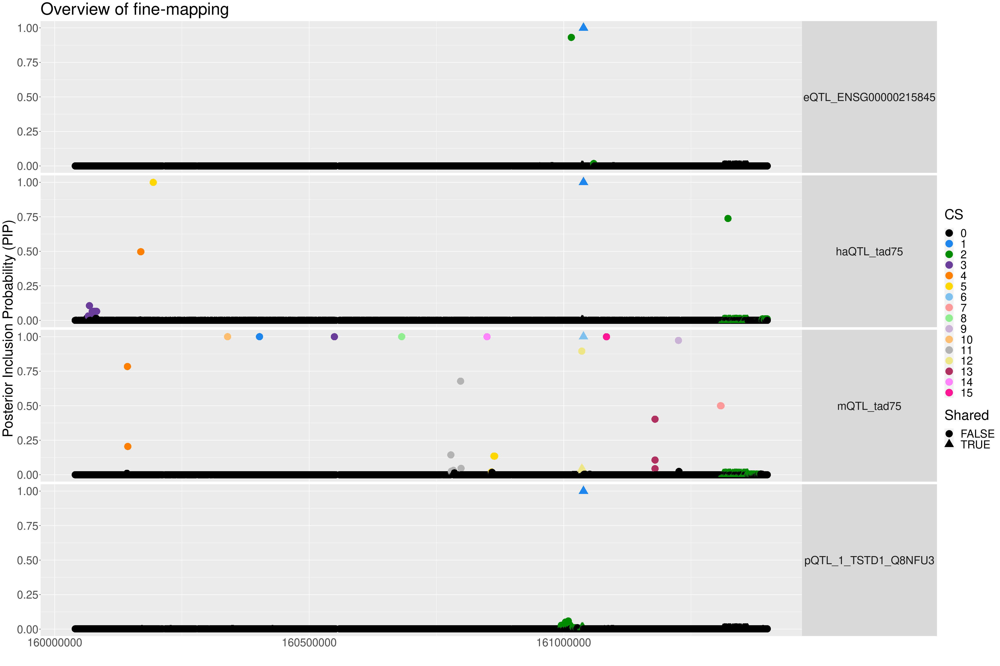

In [161]:
pipplot[[1]]

In [162]:
susiF_obj_me =   Rda$a$mQTL


In [163]:
susiF_obj_me = update_cal_credible_band2(susiF_obj_me)

In [164]:

susiF_obj_ha =  Rda$a$haQTL

In [165]:
susiF_obj_ha = update_cal_credible_band2(susiF_obj_ha)

In [170]:
gene_name%>%filter(gene_id == "ENSG00000215845")

#chr,start,end,gene_id,gene_name
<chr>,<dbl>,<dbl>,<chr>,<chr>
chr1,161038976,161038977,ENSG00000215845,TSTD1


In [171]:
pipplot[[2]]%>%mutate(new_CS = case_when(str_detect(molecular_trait_id,"mQTL" )& CS == 6 ~  1,
                                    str_detect(molecular_trait_id,"mQTL" ) & CS == 1 ~  6,
                                    .default = as.numeric(CS)-1 
                                   ), molecular_trait_id = str_replace(molecular_trait_id,"ENSG00000215845","TSTD1")) -> plot_df_2

In [172]:
gene_name%>%filter(gene_id == "ENSG00000128335")

#chr,start,end,gene_id,gene_name
<chr>,<dbl>,<dbl>,<chr>,<chr>
chr22,36239953,36239954,ENSG00000128335,APOL2


In [181]:
plot_df_2%>%filter(CS !=0, CS ==1 | new_CS == 1 )

y,snp,pos,CS,molecular_trait_id,Shared,new_CS
<dbl>,<chr>,<dbl>,<fct>,<chr>,<lgl>,<dbl>
0.9999872,chr1:161038745_C_G,161038745,1,pQTL_1_TSTD1_Q8NFU3,TRUE,1
1.0000000,chr1:161038745_C_G,161038745,1,eQTL_TSTD1,TRUE,1
1.0000000,chr1:161038745_C_G,161038745,1,haQTL_tad75,TRUE,1
1.0000000,chr1:160402319_G_T,160402319,1,mQTL_tad75,FALSE,6
1.0000000,chr1:161038745_C_G,161038745,6,mQTL_tad75,TRUE,1


In [182]:
plot_range = c(min(pipplot[[2]]$pos),max(pipplot[[2]]$pos))
plot_df_2%>%ggplot2::ggplot(aes(y = y, x = pos,
                              col =  as.factor(new_CS), shape = Shared )) + facet_grid(molecular_trait_id ~.)+
  geom_point(size = 7) +
  scale_color_manual("CS",values = color) +theme_bw()+
  theme(axis.ticks.x = element_blank()) +
 ylab("Posterior Inclusion Probability (PIP)")+
  theme(axis.ticks.x = element_blank()) +
        theme(strip.text.y.right = element_text(angle = 0))+
        xlab("") +
        theme(text = element_text(size = 30))-> refine_pip_plot

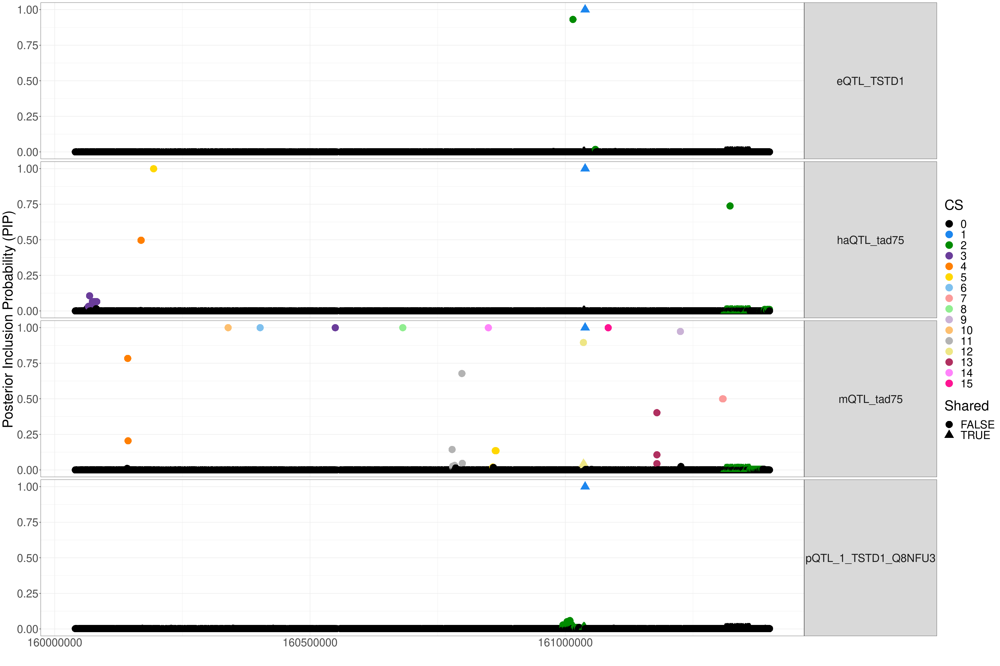

In [183]:
refine_pip_plot

[[1]]
chr22:36239710_G_A 
              2350 

[[2]]
chr22:35646939_C_T chr22:35638936_T_C chr22:35638771_G_A chr22:35638396_C_G 
              1054               1015               1014               1013

In [184]:
which.max = function(m,x){m[which(x == max(x))] }

In [185]:
plot_df_2%>%filter(Shared,new_CS != 0 )%>%count(molecular_trait_id,CS)%>%count(CS)

CS,n
<fct>,<int>
1,3
2,3
6,1
12,1


In [187]:
switch = c(1,6)

In [186]:
output_ha = effect_extract_df(susiF_obj_ha,n = switch[1]) 
output_me = effect_extract_df(susiF_obj_me,n = switch[2])

New names:
• `` -> `...1`
New names:
• `` -> `...1`


In [191]:
paste0("Effect_",switch[1])
paste0("Effect_",switch[2])

[1] "Effect_1"

[1] "Effect_6"

In [196]:
mapper = c("Effect_1"  = 'Effect_6'  ,
'Effect_6'  =   'Effect_1')


In [197]:
output_me = output_me%>%mutate(effect = map_chr(effect,~names(mapper[which(mapper == .x)])))
output_me = output_me%>%mutate(type = paste0("mQTL_" , effect ))
output_ha = output_ha%>%mutate(type = paste0( "haQTL_",effect ))

In [198]:
refine_effect_plot =  rbind(output_me,output_ha)%>%group_by(effect)%>%ggplot(linewidth = 7)+
     geom_line(aes(x = pos, y = mid,color = effect))+geom_ribbon(aes(x = pos, y = mid,ymin = low, ymax = up,fill = effect), alpha = 0.2)+
         ylab("Estimated Effect") + xlab("POS")+geom_hline(aes(yintercept = 0), color = "black")+theme_bw()+
         xlab("") + facet_grid(type ~.)+scale_color_manual("Credible set",values = color[c(1,2)+1])+
         ylab("Estimated Effect")+ scale_fill_manual("Credible set",values = color[c(1,8)+1])+
         theme(text = element_text(size = 40))+  theme(plot.margin=unit(c(5,0,0,0),"mm"), strip.text.y.right = element_text(angle = 0,size = 20),axis.text.x = element_blank(),axis.text.y = element_text(size = 25))

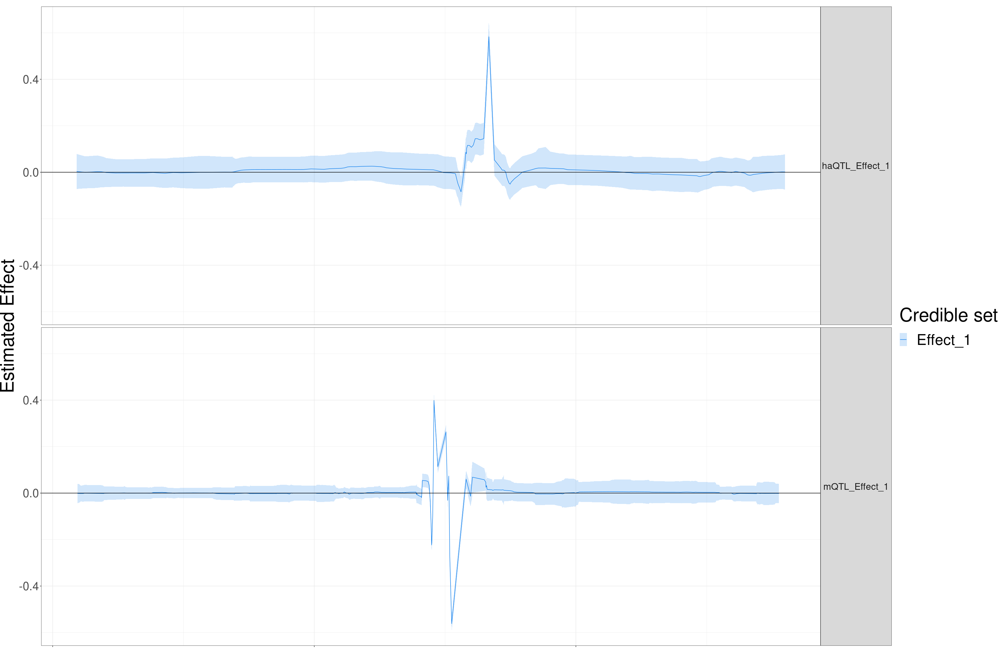

In [199]:
refine_effect_plot

In [200]:
gene_body_filter = gene_body%>%filter(X4 %in% seq(plot_range[1],plot_range[2]) , X5%in% seq(plot_range[1],plot_range[2])   ,X3 =="gene")%>%mutate(gene_id = read.table(text = X9,,sep = "\"")$V2,
                                                                                                    gene_name = read.table(text = X9,,sep = "\"")$V8 ,
                                                                                                   gene_type  = read.table(text = X9,,sep = "\"")$V6 )

In [201]:
gene_name_filter = gene_body_filter%>%select("#chr" = X1, strand = X7, start = X4,end = X5, gene_id,gene_name,gene_type)

In [202]:
switch_end = gene_name_filter[gene_name_filter$strand == "-",4]
gene_name_filter[gene_name_filter$strand == "-",4] = gene_name_filter[gene_name_filter$strand == "-",3]
gene_name_filter[gene_name_filter$strand == "-",3] = switch_end

In [207]:
gene_name_filter%>%filter( gene_name == "TSTD1" )%>%
ggplot(aes()) + geom_segment( aes(x = start,xend = end, y = strand, yend = strand ) , arrow = arrow(length = unit(0.5, "cm")) )+theme_bw()+
geom_label(aes(x = (start),y = "", label = gene_name ), position = position_dodge(width = 1),size = 10)+xlab("")+facet_grid(gene_type~.)+
theme(legend.position="none")+theme(text = element_text(size = 40))+xlim(plot_range)+geom_point(aes(x = start, y = ""), color = "black",size = 3  ) -> gene_plot

In [208]:
gene_name_filter%>%filter(gene_name == "TSTD1")

#chr,strand,start,end,gene_id,gene_name,gene_type
<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
chr1,-,161038977,161037631,ENSG00000215845,TSTD1,protein_coding


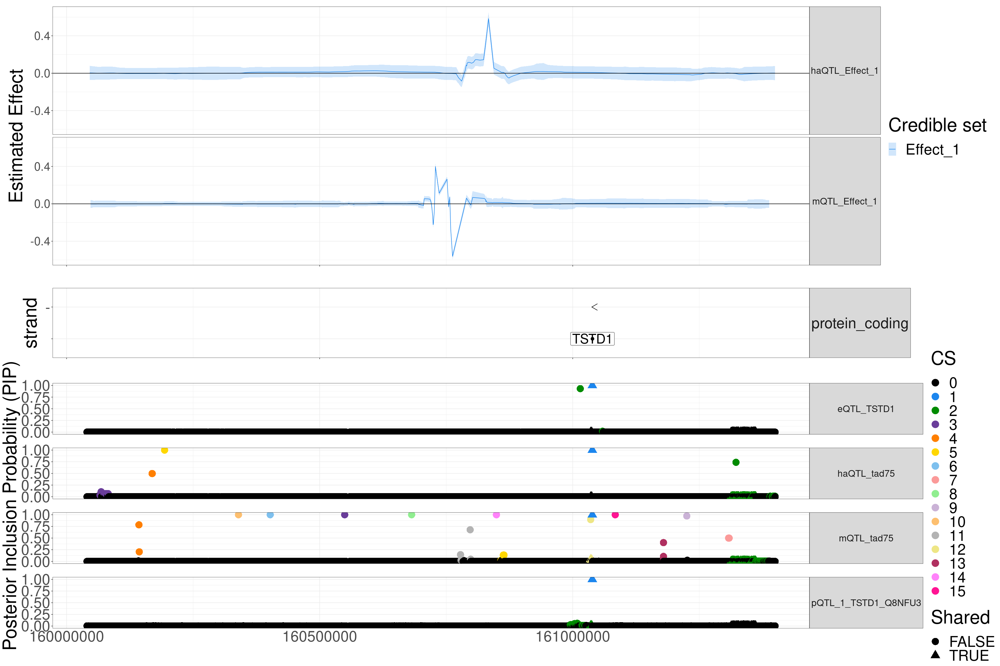

In [209]:
cowplot::plot_grid(plotlist = list(refine_effect_plot+ xlim(plot_range),
                                    gene_plot+theme_bw()+theme(axis.text.x = element_blank()) + theme(strip.text.y.right = element_text(angle = 0))+ xlab("") +theme(text = element_text(size = 40)),
                                   refine_pip_plot+theme_bw()+theme(axis.ticks.x = element_blank()) + theme(strip.text.y.right = element_text(angle = 0,size = 20))+ xlab("") +theme(text = element_text(size = 40),panel.spacing=unit(2, "lines"))
                                  ) ,ncol = 1, align = "v",axis = "tlbr",rel_heights = c(6,2,6))


In [210]:
gene_name_filter%>%write_delim(paste0("4_",tad,"gene_info.tsv"),"\t")
plot_df_2%>%write_delim(paste0("4_",tad,"pip_superfine.tsv"),"\t")
rbind(output_me,output_ha)%>%write_delim(paste0("4_",tad,"effect_superfine.tsv"),"\t")

## 185

In [211]:
tad = "tad185"
pipplot = readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/superfine/pQTL_eQTL_haQTL_mQTL.2_FBLN7_Q53RD9.pip_landscape_plot.rds")


In [212]:
Robjec_path = paste0(tad,".RData")

In [213]:
Rda = attach(Robjec_path)

The following object is masked from file:tad75.RData:

    a


The following object is masked from file:tad1411.RData (pos = 4):

    a


The following object is masked from file:tad1411.RData (pos = 5):

    a


The following object is masked from file:tad1411.RData (pos = 6):

    a




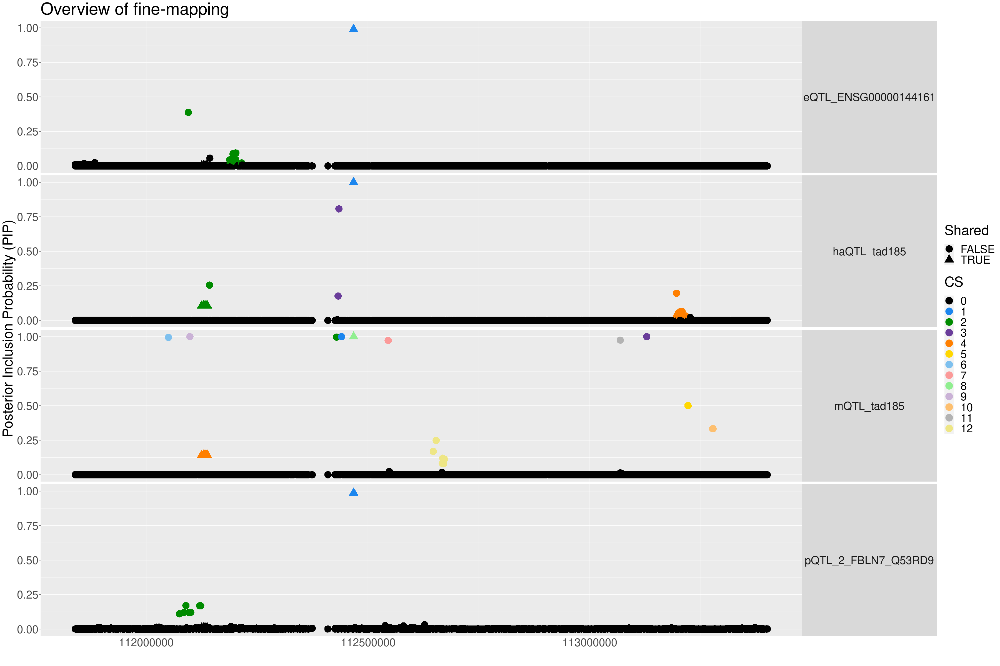

In [214]:
pipplot[[1]]

In [215]:
susiF_obj_me =   Rda$a$mQTL


In [216]:
susiF_obj_me = update_cal_credible_band2(susiF_obj_me)

In [217]:

susiF_obj_ha =  Rda$a$haQTL

In [218]:
susiF_obj_ha = update_cal_credible_band2(susiF_obj_ha)

In [219]:
gene_name%>%filter(gene_id == "ENSG00000144161")

#chr,start,end,gene_id,gene_name
<chr>,<dbl>,<dbl>,<chr>,<chr>
chr2,112255135,112255136,ENSG00000144161,ZC3H8


In [226]:
pipplot[[2]]%>%mutate(new_CS = case_when(str_detect(molecular_trait_id,"mQTL" )& CS == 8 ~  1,
                                    str_detect(molecular_trait_id,"mQTL" ) & CS == 1 ~  8,
                                         str_detect(molecular_trait_id,"mQTL" )& CS == 2 ~  4,
                                    str_detect(molecular_trait_id,"mQTL" ) & CS == 4 ~  2,
                                    .default = as.numeric(CS)-1 
                                   ), molecular_trait_id = str_replace(molecular_trait_id,"ENSG00000144161","ZC3H8")) -> plot_df_2

In [227]:
gene_name%>%filter(gene_id == "ENSG00000144161")

#chr,start,end,gene_id,gene_name
<chr>,<dbl>,<dbl>,<chr>,<chr>
chr2,112255135,112255136,ENSG00000144161,ZC3H8


In [228]:
plot_df_2%>%filter(CS !=0, CS ==1 | new_CS == 1 )

y,snp,pos,CS,molecular_trait_id,Shared,new_CS
<dbl>,<chr>,<dbl>,<fct>,<chr>,<lgl>,<dbl>
0.9862620,chr2:112467578_A_G,112467578,1,pQTL_2_FBLN7_Q53RD9,TRUE,1
0.9895265,chr2:112467578_A_G,112467578,1,eQTL_ZC3H8,TRUE,1
1.0000000,chr2:112467578_A_G,112467578,1,haQTL_tad185,TRUE,1
1.0000000,chr2:112440431_C_T,112440431,1,mQTL_tad185,FALSE,8
1.0000000,chr2:112467578_A_G,112467578,8,mQTL_tad185,TRUE,1


In [229]:
plot_range = c(min(pipplot[[2]]$pos),max(pipplot[[2]]$pos))
plot_df_2%>%ggplot2::ggplot(aes(y = y, x = pos,
                              col =  as.factor(new_CS), shape = Shared )) + facet_grid(molecular_trait_id ~.)+
  geom_point(size = 7) +
  scale_color_manual("CS",values = color) +theme_bw()+
  theme(axis.ticks.x = element_blank()) +
 ylab("Posterior Inclusion Probability (PIP)")+
  theme(axis.ticks.x = element_blank()) +
        theme(strip.text.y.right = element_text(angle = 0))+
        xlab("") +
        theme(text = element_text(size = 30))-> refine_pip_plot

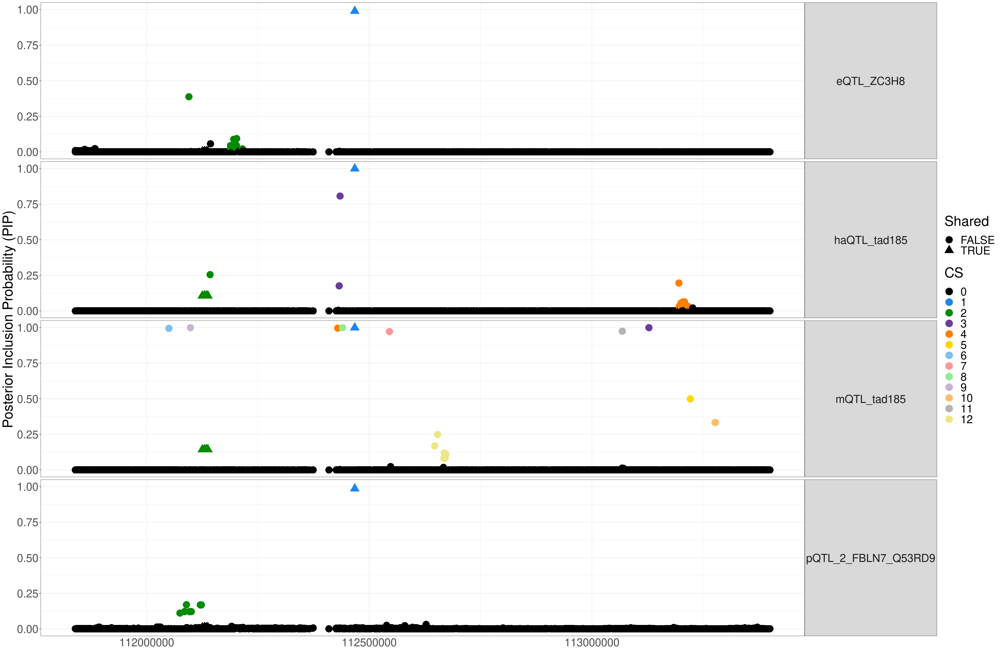

In [230]:
refine_pip_plot

In [231]:
which.max = function(m,x){m[which(x == max(x))] }

In [232]:
plot_df_2%>%filter(Shared,new_CS != 0 )%>%count(molecular_trait_id,CS)%>%count(CS)

CS,n
<fct>,<int>
1,3
2,1
4,1
8,1


In [233]:
output_ha = effect_extract_df(susiF_obj_ha,n =c(1,2)) 
output_me = effect_extract_df(susiF_obj_me,n = c(8,4))

New names:
• `` -> `...1`
• `` -> `...2`
New names:
• `` -> `...1`
• `` -> `...2`


In [265]:
output_ha = effect_extract_df(susiF_obj_ha,n =c(1)) 
output_me = effect_extract_df(susiF_obj_me,n = c(8))

New names:
• `` -> `...1`
New names:
• `` -> `...1`


In [272]:
mapper = c("Effect_1"  = 'Effect_8'  ,
'Effect_8'  =   'Effect_1',
          "Effect_2"  = 'Effect_4'  ,
'Effect_4'  =   'Effect_2'
          
          )


In [273]:
output_me = output_me%>%mutate(effect = map_chr(effect,~names(mapper[which(mapper == .x)])))
output_me = output_me%>%mutate(type = paste0("mQTL_" , effect ))
output_ha = output_ha%>%mutate(type = paste0( "haQTL_",effect ))

In [274]:
refine_effect_plot =  rbind(output_me,output_ha)%>%group_by(effect)%>%ggplot(linewidth = 7)+
     geom_line(aes(x = pos, y = mid,color = effect,group = effect))+geom_ribbon(aes(x = pos, y = mid,ymin = low, ymax = up,fill = effect), alpha = 0.2)+
         ylab("Estimated Effect") + xlab("POS")+geom_hline(aes(yintercept = 0), color = "black")+theme_bw()+
         xlab("") + facet_grid(type ~.)+scale_color_manual("Credible set",values = color[c(1,2)+1])+facet_grid(type~.)+#+facet_grid(factor(type,levels =  c("haQTL_Effect_1","mQTL_Effect_1","haQTL_Effect_2","mQTL_Effect_2"), labels =   c("haQTL_CS_1","mQTL_CS_1","haQTL_CS_2","mQTL_CS_2"))~.)+
         ylab("Estimated Effect")+ scale_fill_manual("Credible set",values = color[c(1,8)+1])+
         theme(text = element_text(size = 40))+  theme(plot.margin=unit(c(5,0,0,0),"mm"), strip.text.y.right = element_text(angle = 0,size = 20),axis.text.x = element_blank(),axis.text.y = element_text(size = 25))

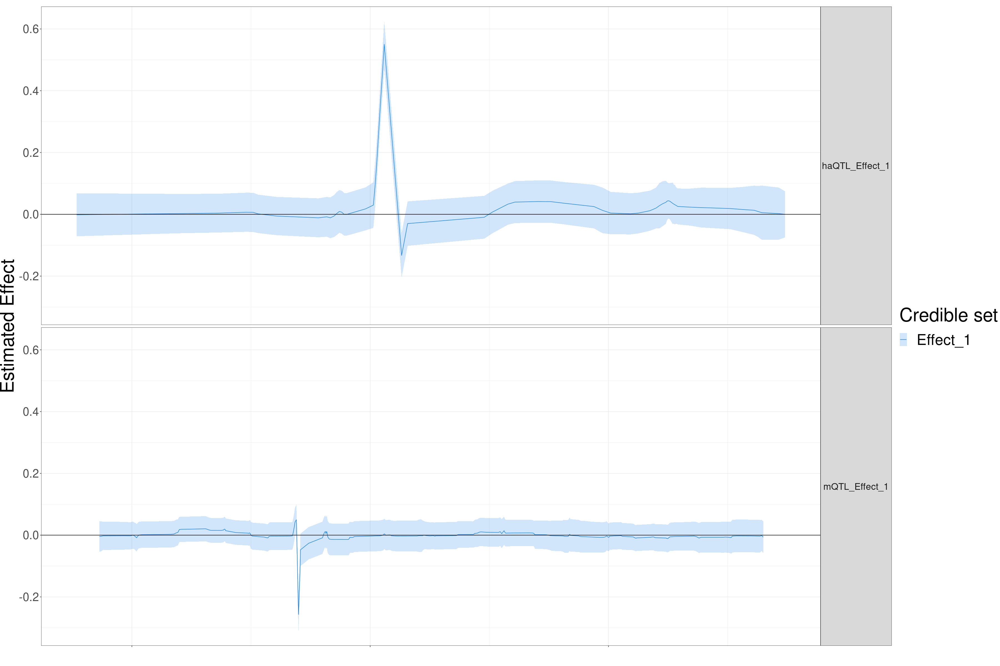

In [275]:
refine_effect_plot

In [259]:
gene_body_filter = gene_body%>%filter(X4 %in% seq(plot_range[1],plot_range[2]) , X5%in% seq(plot_range[1],plot_range[2])   ,X3 =="gene")%>%mutate(gene_id = read.table(text = X9,,sep = "\"")$V2,
                                                                                                    gene_name = read.table(text = X9,,sep = "\"")$V8 ,
                                                                                                   gene_type  = read.table(text = X9,,sep = "\"")$V6 )

In [260]:
gene_name_filter = gene_body_filter%>%select("#chr" = X1, strand = X7, start = X4,end = X5, gene_id,gene_name,gene_type)

In [262]:
switch_end = gene_name_filter[gene_name_filter$strand == "-",4]
gene_name_filter[gene_name_filter$strand == "-",4] = gene_name_filter[gene_name_filter$strand == "-",3]
gene_name_filter[gene_name_filter$strand == "-",3] = switch_end
gene_name_filter%>%filter(gene_name %in% c("FBLN7","ZC3H8"))%>%
ggplot(aes()) + geom_segment( aes(x = start,xend = end, y = strand, yend = strand ) , arrow = arrow(length = unit(0.5, "cm")) )+theme_bw()+
geom_label(aes(x = (start),y = "", label = gene_name ), position = position_dodge(width = 1),size = 10)+xlab("")+facet_grid(gene_type~.)+
theme(legend.position="none")+theme(text = element_text(size = 40))+xlim(plot_range)+geom_point(aes(x = start, y = ""), color = "black",size = 3  ) -> gene_plot

In [263]:
gene_name_filter%>%filter(gene_name %in% c("FBLN7","ZC3H8"))

#chr,strand,start,end,gene_id,gene_name,gene_type
<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
chr2,+,112138385,112188218,ENSG00000144152,FBLN7,protein_coding
chr2,-,112255136,112211529,ENSG00000144161,ZC3H8,protein_coding


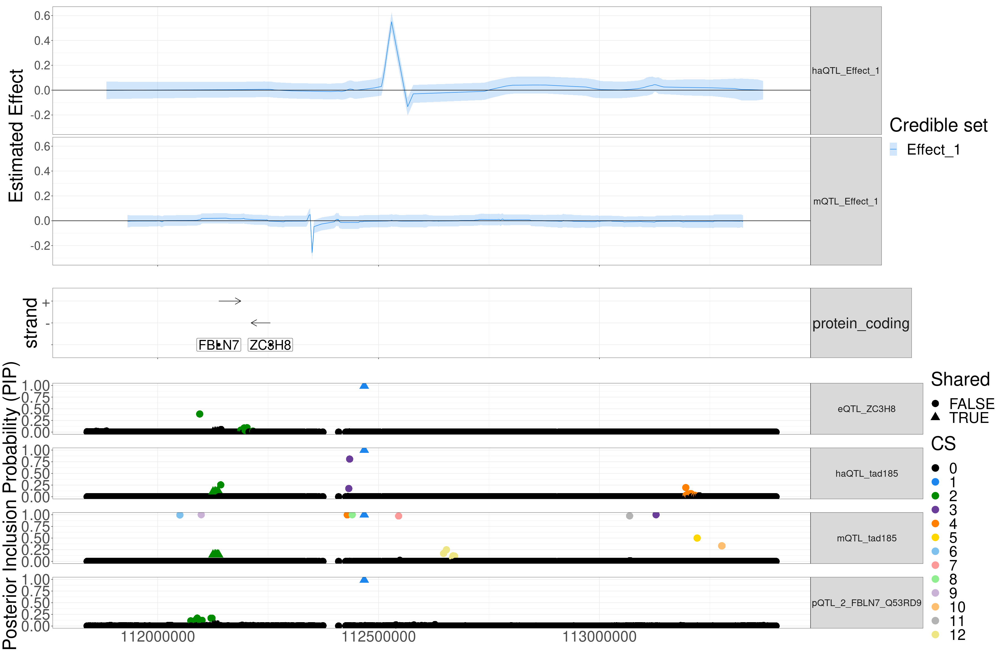

In [276]:
cowplot::plot_grid(plotlist = list(refine_effect_plot+ xlim(plot_range),
                                    gene_plot+theme_bw()+theme(axis.text.x = element_blank()) + theme(strip.text.y.right = element_text(angle = 0))+ xlab("") +theme(text = element_text(size = 40)),
                                   refine_pip_plot+theme_bw()+theme(axis.ticks.x = element_blank()) + theme(strip.text.y.right = element_text(angle = 0,size = 20))+ xlab("") +theme(text = element_text(size = 40),panel.spacing=unit(2, "lines"))
                                  ) ,ncol = 1, align = "v",axis = "tlbr",rel_heights = c(6,2,6))


In [277]:
gene_name_filter%>%write_delim(paste0("4_",tad,"gene_info.tsv"),"\t")
plot_df_2%>%write_delim(paste0("4_",tad,"pip_superfine.tsv"),"\t")
rbind(output_me,output_ha)%>%write_delim(paste0("4_",tad,"effect_superfine.tsv"),"\t")

## 426

In [219]:
pipplot = readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/superfine/pQTL_haQTL_mQTL_eQTL_eQTL_eQTL_eQTL.4_SLC7A11_Q9UPY5.pip_landscape_plot.rds")

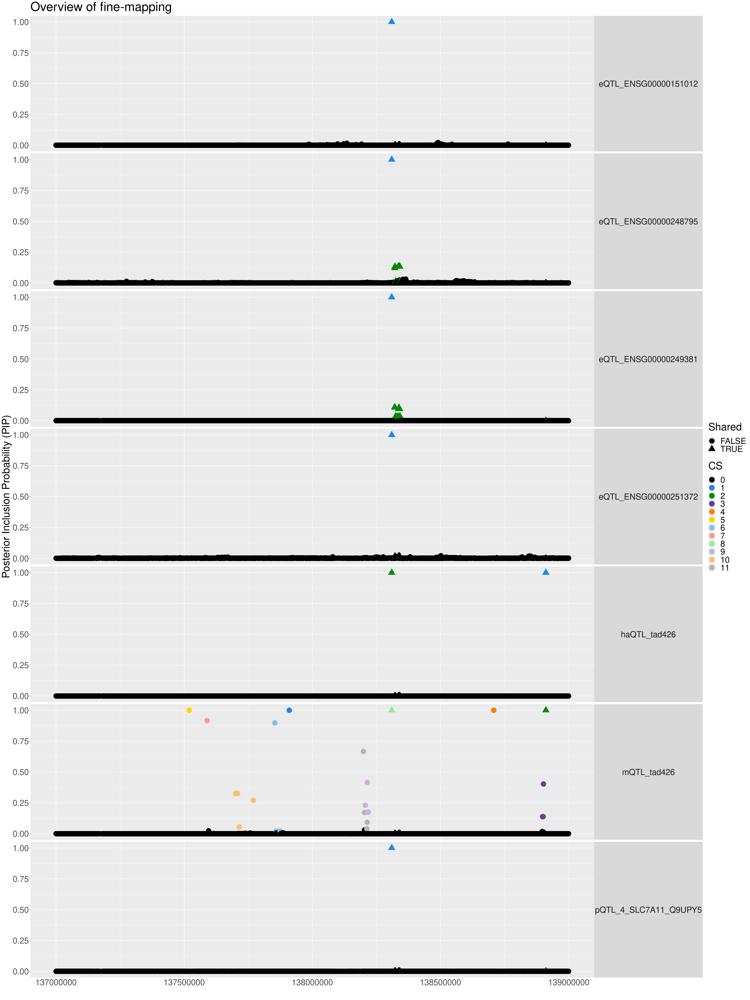

In [220]:
pipplot[[1]]

In [246]:
plot_range = c(min(pipplot[[2]]$pos),max(pipplot[[2]]$pos))
pipplot[[2]]%>%ggplot2::ggplot(aes(y = y, x = pos,
                              col =  as.factor(CS), shape = Shared )) + facet_grid(molecular_trait_id ~.)+
  geom_point(size = 7) +
  scale_color_manual("CS",values = color) +theme_bw()+
  theme(axis.ticks.x = element_blank()) +
 ylab("Posterior Inclusion Probability (PIP)")+
  theme(axis.ticks.x = element_blank()) +
        theme(strip.text.y.right = element_text(angle = 0))+
        xlab("") +
        theme(text = element_text(size = 30))-> refine_pip_plot

In [247]:
plot_range

[1] 137000342 138999288

In [241]:
susiF_obj_me =   readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/definitive_mQTL/meQTL.yuqi_mqtl.tad426.uni_Fsusie.mixture_normal_per_scale.rds")


In [242]:
susiF_obj_me = update_cal_credible_band2(susiF_obj_me)

In [243]:

susiF_obj_ha =  readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/definitive_haQTL/haQTL.rosmap_haqtl.tad426.uni_Fsusie.mixture_normal_per_scale.rds")


In [244]:
susiF_obj_ha = update_cal_credible_band2(susiF_obj_ha)

In [240]:
susiF_obj_ha$cs

[[1]]
chr22:36239710_G_A 
              2350 

[[2]]
chr22:35646939_C_T chr22:35638936_T_C chr22:35638771_G_A chr22:35638396_C_G 
              1054               1015               1014               1013

In [258]:
 output_ha = effect_extract_df(susiF_obj_ha,n = c(2)) 
output_me = effect_extract_df(susiF_obj_me,n = c(8))

New names:
• `` -> `...1`
New names:
• `` -> `...1`


In [259]:
refine_effect_plot =  rbind(output_me,output_ha)%>%group_by(effect)%>%ggplot(linewidth = 7)+
     geom_line(aes(x = pos, y = mid,color = effect))+geom_ribbon(aes(x = pos, y = mid,ymin = low, ymax = up,fill = effect), alpha = 0.2)+
         ylab("Estimated Effect") + xlab("POS")+geom_hline(aes(yintercept = 0), color = "black")+theme_bw()+
         xlab("") + facet_grid(effect ~.)+scale_color_manual("Credible set",values = color[c(2,8)+1])+
         ylab("Estimated Effect")+ scale_fill_manual("Credible set",values = color[c(2,8)+1])+
         theme(text = element_text(size = 40))+  theme(plot.margin=unit(c(5,0,0,0),"mm"), strip.text.y.right = element_text(angle = 0,size = 20),axis.text.x = element_blank(),axis.text.y = element_text(size = 25))

In [248]:
gene_body_filter = gene_body%>%filter(X4 %in% seq(plot_range[1],plot_range[2]) , X5%in% seq(plot_range[1],plot_range[2])   ,X3 =="gene")%>%mutate(gene_id = read.table(text = X9,,sep = "\"")$V2,
                                                                                                    gene_name = read.table(text = X9,,sep = "\"")$V8 ,
                                                                                                   gene_type  = read.table(text = X9,,sep = "\"")$V6 )

In [249]:
gene_name_filter = gene_body_filter%>%select("#chr" = X1, strand = X7, start = X4,end = X5, gene_id,gene_name,gene_type)

In [250]:
switch_end = gene_name_filter[gene_name_filter$strand == "-",4]
gene_name_filter[gene_name_filter$strand == "-",4] = gene_name_filter[gene_name_filter$strand == "-",3]
gene_name_filter[gene_name_filter$strand == "-",3] = switch_end

In [251]:
gene_name_filter%>%filter( gene_name == "SLC7A11" | gene_id %in% c("ENSG00000151012","ENSG00000248795","ENSG00000249381","ENSG00000251372") )%>%
ggplot(aes()) + geom_segment( aes(x = start,xend = end, y = strand, yend = strand ) , arrow = arrow(length = unit(0.5, "cm")) )+theme_bw()+
geom_label(aes(x = (start),y = "", label = gene_name ), position = position_dodge(width = 1),size = 10)+xlab("")+facet_grid(gene_type~.)+
theme(legend.position="none")+theme(text = element_text(size = 40))+xlim(plot_range)+geom_point(aes(x = start, y = ""), color = "black",size = 3  ) -> gene_plot

In [262]:
gene_name_filter%>%filter( gene_name == "SLC7A11"  )


#chr,strand,start,end,gene_id,gene_name,gene_type
<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
chr4,-,138242349,138164097,ENSG00000151012,SLC7A11,protein_coding


In [ ]:
ENSG00000151012	chr4:138309666_C_A
ENSG00000248795	chr4:138309666_C_A
ENSG00000249381	chr4:138309666_C_A
ENSG00000251372	chr4:138309666_C_A


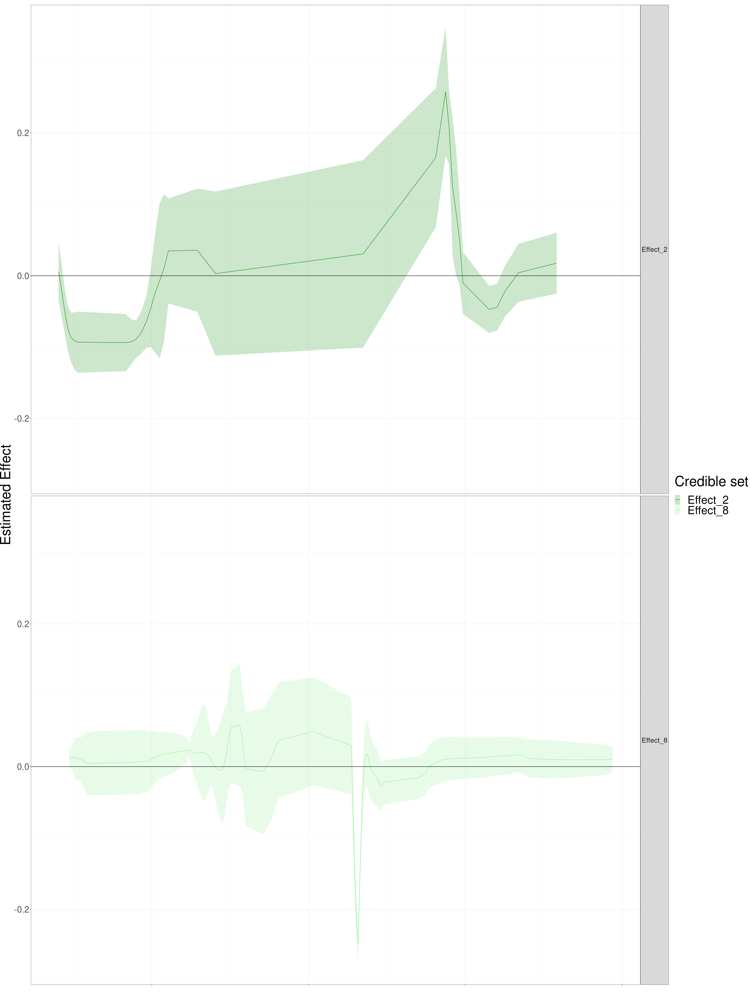

In [260]:
refine_effect_plot

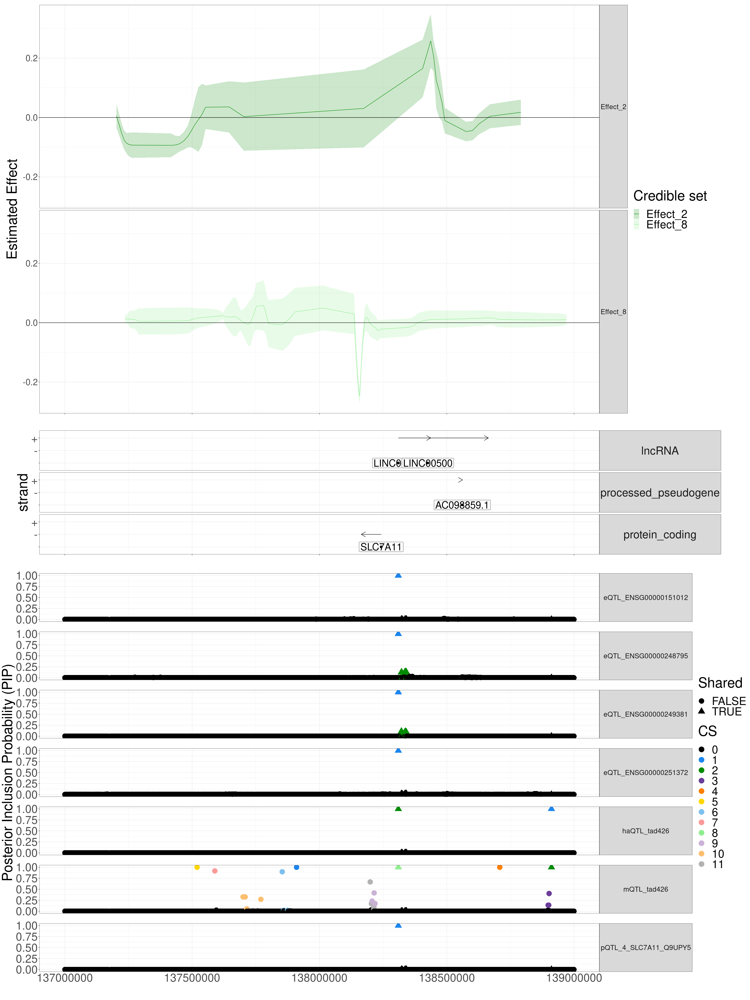

In [261]:
cowplot::plot_grid(plotlist = list(refine_effect_plot+ xlim(plot_range),
                                    gene_plot+theme_bw()+theme(axis.text.x = element_blank()) + theme(strip.text.y.right = element_text(angle = 0))+ xlab("") +theme(text = element_text(size = 40)),
                                   refine_pip_plot+theme_bw()+theme(axis.ticks.x = element_blank()) + theme(strip.text.y.right = element_text(angle = 0,size = 20))+ xlab("") +theme(text = element_text(size = 40),panel.spacing=unit(2, "lines"))
                                  ) ,ncol = 1, align = "v",axis = "tlbr",rel_heights = c(6,2,6))


## two peaks

## 174 

In [44]:
tad = "tad174"


In [ ]:
pipplot = readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/superfine/pQTL_eQTL_haQTL_mQTL.2_FBLN7_Q53RD9.pip_landscape_plot.rds")


In [18]:
Robjec_path = "refined_tad174_ha_haQTL.RData"

In [45]:
Rda = attach(Robjec_path)

The following object is masked from file:refined_tad174_ha_haQTL.RData (pos = 6):

    tad174_1


The following object is masked from file:refined_tad174_ha_haQTL.RData (pos = 16):

    tad174_1




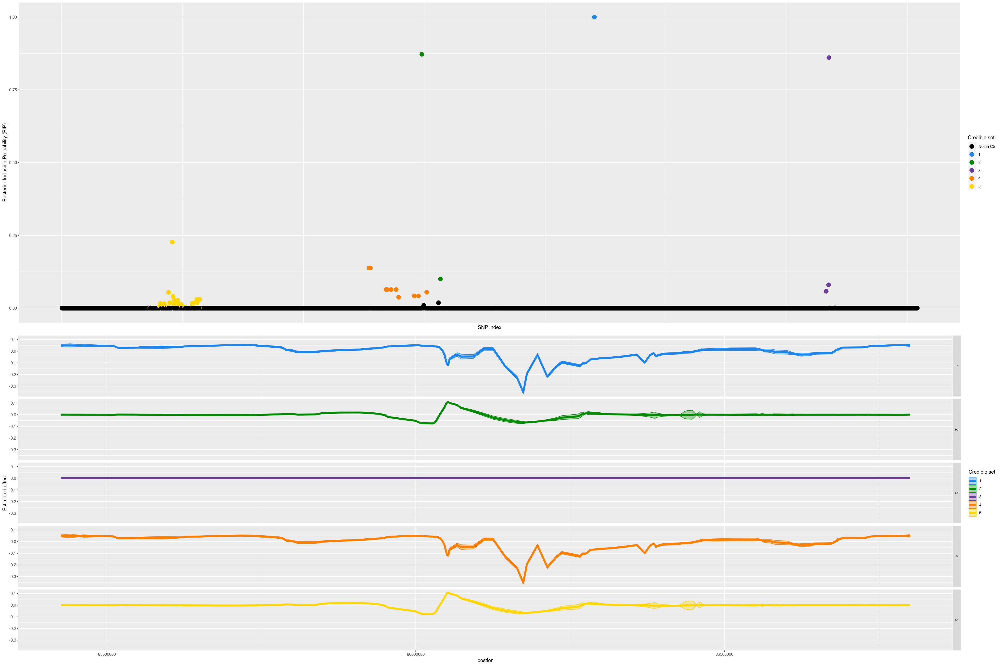

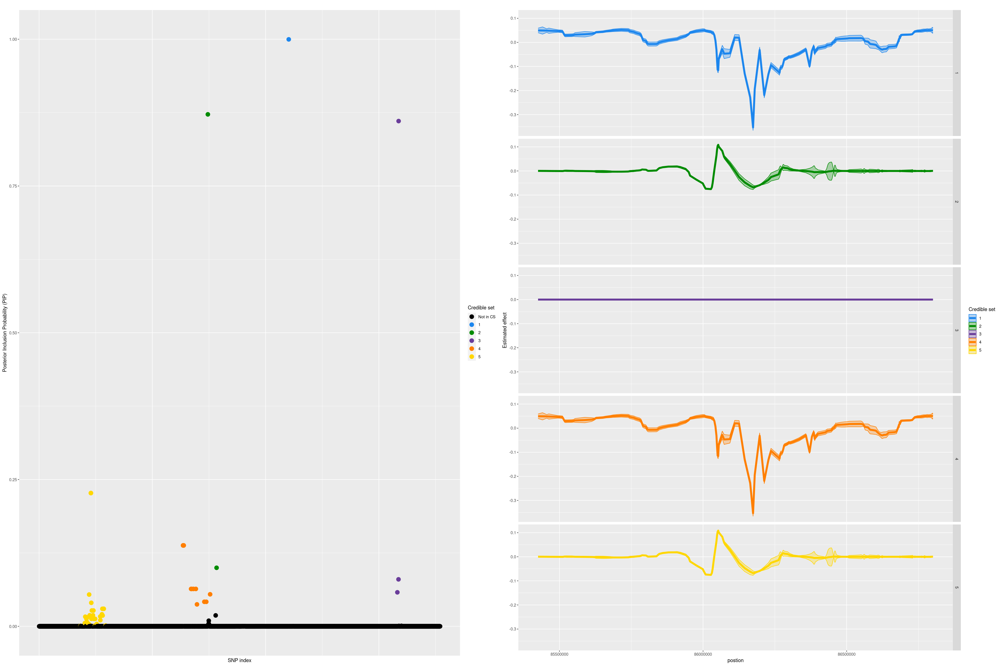

In [68]:
plot_susiF(Rda2$tad174_1)

## TAD 1217 5

In [21]:
Rda = attach("refined_tad1217_5.RData")

The following object is masked from file:refined_tad1217_5.RData (pos = 5):

    tad1217_5




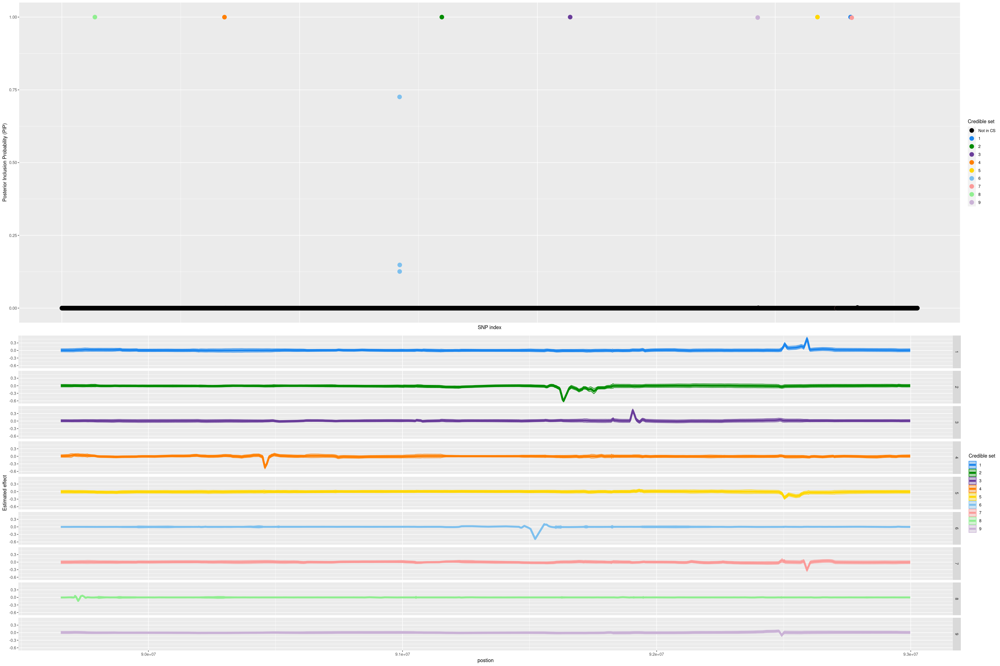

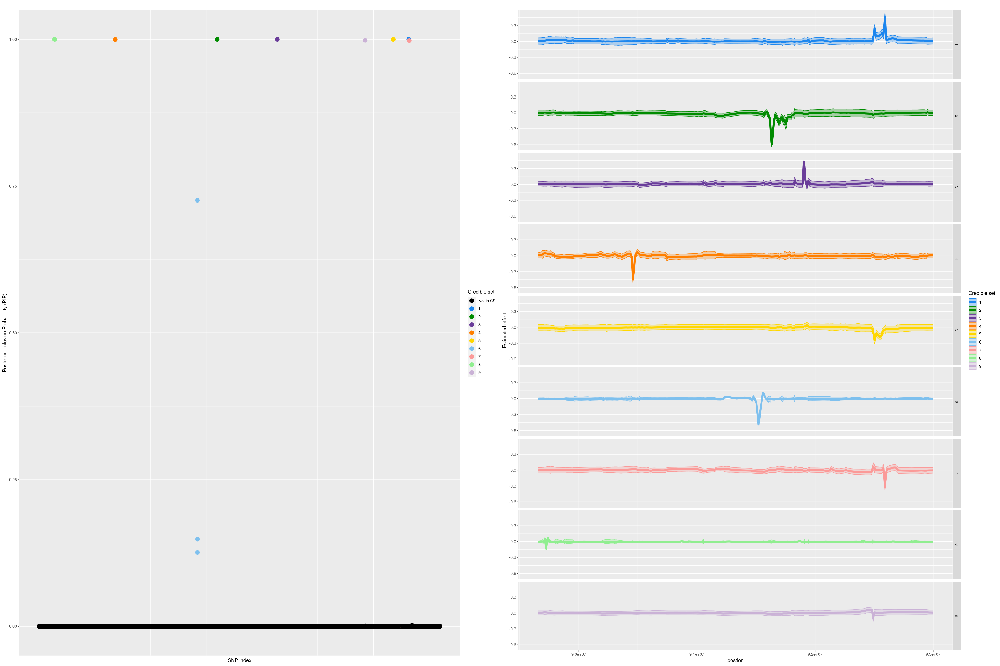

In [22]:
plot_susiF(Rda$tad1217_5)

The following object is masked from file:refined_tad653_3.RData (pos = 5):

    tad653_3




In [25]:
  update_cal_credible_band2 <- function(susiF.obj )
    {
    
    
    
      if(sum( is.na(unlist(susiF.obj$alpha))))
      {
        stop("Error: some alpha value not updated, please update alpha value first")
      }
      temp <- wavethresh::wd(rep(0, susiF.obj$n_wac))
    
    
      for ( l in 1:susiF.obj$L)
      {
        Smat <-  susiF.obj$fitted_wc2[[l]]
        W1   <- ((wavethresh::GenW(n=  ncol(Smat )  , filter.number = 10, family = "DaubLeAsymm")))
        tt   <- diag( W1%*%diag(c(susiF.obj$alpha[[l]]%*%Smat ))%*% t(W1 ))
    
        up                       <-  susiF.obj$fitted_func[[l]]+ 3*sqrt(tt)
        low                      <-  susiF.obj$fitted_func[[l]]- 3*sqrt(tt)
        susiF.obj$cred_band[[l]] <- rbind(up, low)
      }
    for (i in 1:susiF.obj$L){
    rownames(susiF.obj$cred_band[[i]]) = paste0("Effect_",i,":",rownames(susiF.obj$cred_band[[i]]))

    }
    
    
      return(susiF.obj)
    }

In [32]:
effect_extract_df = function(fsusie,n = 1:length(fsusie$fitted_func) ){
    color = c("black", "dodgerblue2", "green4", "#6A3D9A",
      "#FF7F00", "gold1", "skyblue2", "#FB9A99", "palegreen2",
      "#CAB2D6", "#FDBF6F", "gray70", "khaki2", "maroon", "orchid1",
      "deeppink1", "blue1", "steelblue4", "darkturquoise", "green1",
      "yellow4", "yellow3","darkorange4","brown","navyblue","#FF0000",
      "darkgreen","#FFFF00","purple","#00FF00","pink","#0000FF",
      "orange","#FF00FF","cyan","#00FFFF","#FFFFFF")
    ## Define Function
    ## Define Function

    fsusie = update_cal_credible_band2(fsusie)
     plot_df = ((fsusie$fitted_func[n])%>%as_tibble(.name_repair = "universal")%>%mutate(pos =  fsusie$outing_grid)%>%`colnames<-`(c(paste0("Effect_",n,":mid"),"pos"))%>%mutate(`#chr` = str_split(names(fsusie$csd_X)[[1]],":")[[1]][[1]] ))%>%dplyr::select(`#chr`, pos, everything())
    plot_df = cbind(plot_df ,t(Reduce(rbind,fsusie$cred_band[n]))  )
    plot_df = plot_df%>%pivot_longer(cols = 3:ncol(plot_df), names_to = c("effect",".value"),names_prefix = "" , names_sep = ":") 
   
     return(plot_df)
     }

In [30]:
## Define Function
    update_cal_credible_band2 <- function(susiF.obj )
    {
    for (i in 1:susiF.obj$L){
    rownames(susiF.obj$cred_band[[i]]) = paste0("Effect_",i,":",rownames(susiF.obj$cred_band[[i]]))

    }
    
      return(susiF.obj)
    }

In [48]:
plot_effect = function(plot_df){
plot = plot_df%>%arrange(-abs(mid))%>%group_by(effect)%>%ggplot(linewidth = 7)+
     geom_line(aes(x = pos, y = mid,color = effect))+geom_ribbon(aes(x = pos, y = mid,ymin = low, ymax = up,fill = effect), alpha = 0.2)+
         ylab("Estimated Effect") + xlab("POS")+geom_hline(aes(yintercept = 0), color = "black")+theme_bw()+
         xlab("") + facet_grid(effect ~.)+scale_color_manual("Credible set",values = color)+
         ylab("Estimated Effect")+ scale_fill_manual("Credible set",values = color)+
         theme(text = element_text(size = 40))+  theme(plot.margin=unit(c(5,0,0,0),"mm"), strip.text.y.right = element_text(angle = 0,size = 20),axis.text.y = element_text(size = 25))
return(plot)
}

In [67]:

Rda2 = attach("refined_tad174_ha_haQTL.RData")

The following object is masked from file:refined_tad174_ha_haQTL.RData (pos = 3):

    tad174_1


The following object is masked from file:refined_tad174_ha_haQTL.RData (pos = 7):

    tad174_1


The following object is masked from file:refined_tad174_ha_haQTL.RData (pos = 11):

    tad174_1


The following object is masked from file:refined_tad174_ha_haQTL.RData (pos = 21):

    tad174_1




In [63]:
effect_extract_df(Rda2$tad174_1)%>%plot_effect()

ERROR: Error in susiF.obj$cred_band[[i]]: subscript out of bounds


In [65]:
Rda2$tad174_1$cred_band

up,0.05892829,0.06421177,0.05635248,0.05921477,0.05570285,0.05209483,0.05135469,0.05063606,0.04935058,0.04769317,⋯,0.05599399,0.05690566,0.05700930,0.05662905,0.05902870,0.05905473,0.05827107,0.06276827,0.05949706,0.06165316
low,0.04009324,0.03426523,0.04133337,0.03754310,0.03976098,0.04182252,0.04094295,0.03970721,0.03868592,0.03777639,⋯,0.04498502,0.04425374,0.04426194,0.04467607,0.04223014,0.04206102,0.04259410,0.03777784,0.04068066,0.03808509
up,0.001897586,0.001553274,0.0010992452,0.0007106028,0.0005819526,0.0006471035,0.0007438562,0.0007899564,0.0007749514,0.0007504131,⋯,0.001622438,0.002997075,0.003098791,0.002307085,0.001430008,0.0011127907,0.001444817,0.0017792823,0.002013284,0.002065537
low,-0.001173312,-0.001043095,-0.0008500882,-0.0007377817,-0.0008671247,-0.0011488884,-0.0014020060,-0.0015161763,-0.0014675574,-0.0013205490,⋯,-0.002097858,-0.003369384,-0.003305729,-0.002306095,-0.001203573,-0.0006612659,-0.000791862,-0.0009757853,-0.001133518,-0.001209284


In [66]:
effect_extract_df(Rda2$tad174_1,c(1,2))%>%plot_effect()

ERROR: Error in susiF.obj$cred_band[[i]]: subscript out of bounds


In [56]:
Rda1 = attach("refined_tad1217_5.RData")

The following object is masked from file:refined_tad1217_5.RData (pos = 4):

    tad1217_5


The following object is masked from file:refined_tad1217_5.RData (pos = 6):

    tad1217_5


The following object is masked from file:refined_tad1217_5.RData (pos = 8):

    tad1217_5


The following object is masked from file:refined_tad1217_5.RData (pos = 11):

    tad1217_5




In [59]:
Rda1$tad1217_5$cs

[[1]]
chr15:92734199_C_G 
              9951 

[[2]]
chr15:91104210_T_G 
              4794 

[[3]]
chr15:91664536_A_C 
              6413 

[[4]]
chr15:90295161_C_T 
              2052 

[[5]]
chr15:92624920_G_A 
              9533 

[[6]]
chr15:90955016_A_C chr15:90955063_G_A chr15:90955051_C_T 
              4261               4263               4262 

[[7]]
chr15:92737247_G_T chr15:92703941_A_G chr15:92704183_C_T 
              9965               9775               9776 

[[8]]
chr15:89751058_T_G 
               417 

[[9]]
chr15:92443849_T_A 
              8779

In [74]:
effect_extract_df(Rda1$tad1217_5,c(1,2))-> plot_df

New names:
• `` -> `...1`
• `` -> `...2`


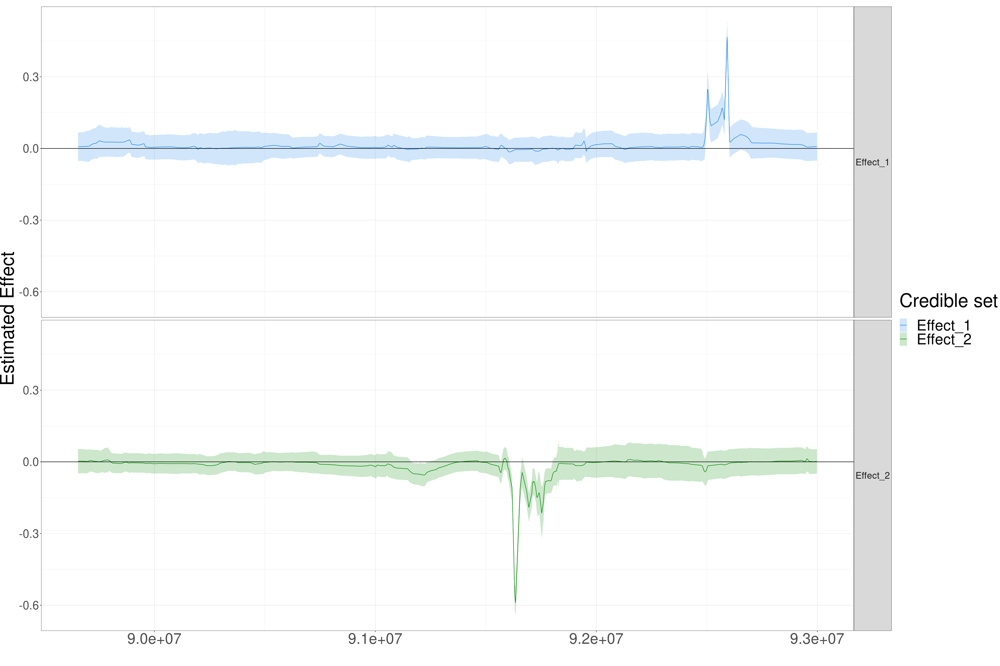

In [75]:
plot_df%>%plot_effect

In [83]:
plot_range = c( min(plot_df$pos),max(plot_df$pos))

In [78]:
gene_body_filter = gene_body%>%filter(X1 == "chr15",X4 >= min(plot_df$pos), X5 <=  max(plot_df$pos),X3 =="gene")%>%mutate(gene_id = read.table(text = X9,,sep = "\"")$V2,
                                                                                                    gene_name = read.table(text = X9,,sep = "\"")$V8 ,
                                                                                                   gene_type  = read.table(text = X9,,sep = "\"")$V6 )

In [80]:
gene_name_filter = gene_body_filter%>%select("#chr" = X1, strand = X7, start = X4,end = X5, gene_id,gene_name,gene_type)

In [90]:
switch_end = gene_name_filter[gene_name_filter$strand == "-",4]
gene_name_filter[gene_name_filter$strand == "-",4] = gene_name_filter[gene_name_filter$strand == "-",3]
gene_name_filter[gene_name_filter$strand == "-",3] = switch_end
gene_name_filter%>%filter(gene_id %in% c("ENSG00000185442","ENSG00000185518"))%>%
ggplot(aes()) + geom_segment( aes(x = start,xend = end, y = strand, yend = strand ) , arrow = arrow(length = unit(0.5, "cm")) )+theme_bw()+
geom_label(aes(x = (start),y = "", label = gene_name ), position = position_dodge(width = 1),size = 10)+xlab("")+facet_grid(gene_type~.)+
theme(legend.position="none")+theme(text = element_text(size = 40))+xlim(plot_range)+geom_point(aes(x = start, y = ""), color = "black",size = 3  ) -> gene_plot

In [89]:
c("ENSG00000185442","ENSG00000185518")

[1] "ENSG00000185442" "ENSG00000185518"

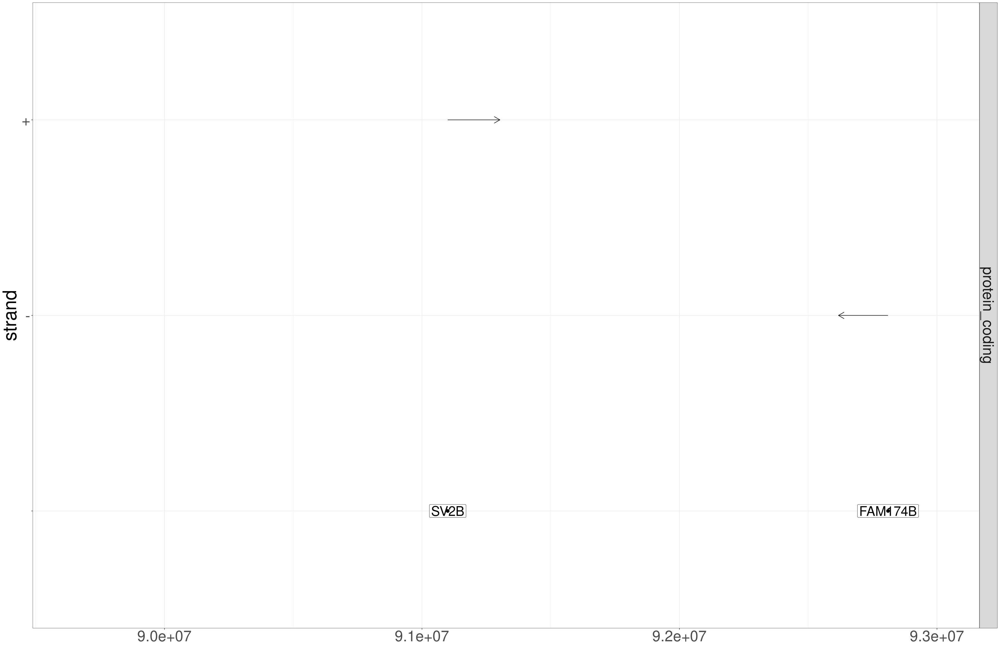

In [91]:
gene_plot

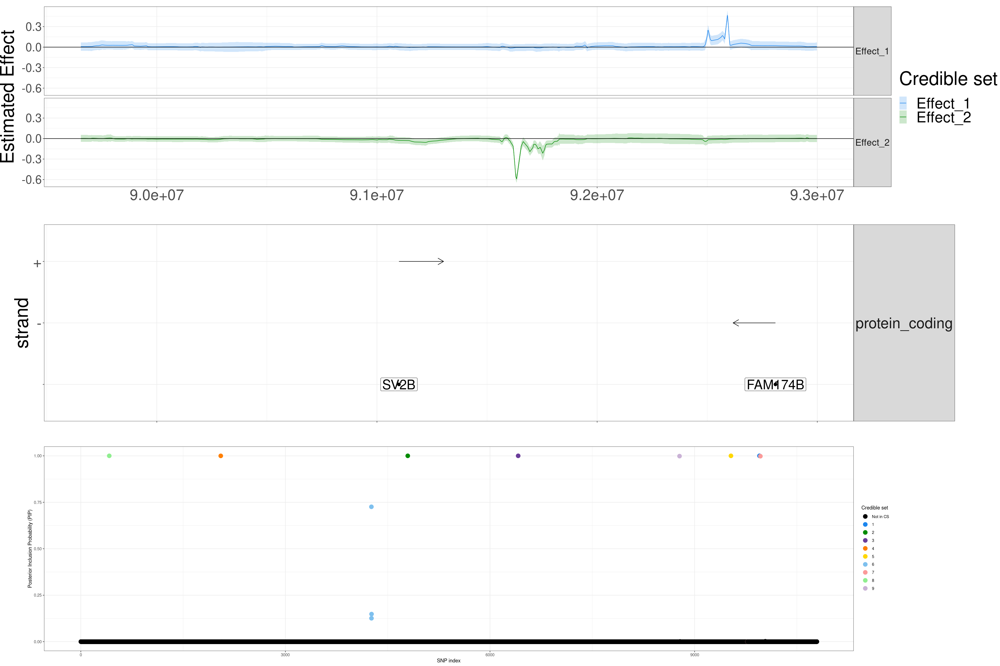

In [102]:
cowplot::plot_grid(plotlist = list(plot_df%>%plot_effect+ xlim(plot_range),
                                    gene_plot+theme_bw()+theme(axis.text.x = element_blank()) + theme(strip.text.y.right = element_text(angle = 0))+ xlab("") +theme(text = element_text(size = 40)),
                                   plot_susiF(Rda1$tad1217_5,pip_only = TRUE)+theme_bw()
                                  ) ,ncol = 1, align = "v",axis = "tlbr",rel_heights = c(6,6))


In [85]:
gene_name_filter

#chr,strand,start,end,gene_id,gene_name,gene_type
<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
chr15,-,89664367,89679427,ENSG00000166819,PLIN1,protein_coding
chr15,-,89677764,89690783,ENSG00000166821,PEX11A,protein_coding
chr15,-,89687937,89688243,ENSG00000241362,RPL36AP43,processed_pseudogene
chr15,+,89690811,89743638,ENSG00000140527,WDR93,protein_coding
chr15,+,89704665,89705415,ENSG00000259561,AC079075.1,lncRNA
chr15,+,89714232,89714338,ENSG00000206590,RNU6-132P,snRNA
chr15,-,89748661,89751310,ENSG00000166823,MESP1,protein_coding
chr15,+,89752296,89753493,ENSG00000259441,MRPL15P1,processed_pseudogene
chr15,+,89760591,89778754,ENSG00000188095,MESP2,protein_coding


In [71]:
head(Rda1$tad1217_5$input_data$X)

,chr15:89600153_G_T,chr15:89600336_A_G,chr15:89601620_T_C,chr15:89601663_T_C,chr15:89601713_G_A,chr15:89602546_C_T,chr15:89603537_G_A,chr15:89603680_T_C,chr15:89603861_G_A,chr15:89604356_G_A,⋯,chr15:92996859_T_C,chr15:92997767_C_T,chr15:92997959_A_AC,chr15:92998770_C_G,chr15:92998849_T_C,chr15:92998858_C_T,chr15:92999051_T_C,chr15:92999705_G_T,chr15:92999712_A_G,chr15:92999812_A_G
SM-CJEFU,-0.935963387,-1.59667214,0.76707456,0.76707456,0.76707456,-0.99428006,0.74296560,-1.02656507,1.7496510,-0.9658608,⋯,-0.9027090,-0.4785919,-0.4464153,-1.0715791,-0.4464153,0.7279842,0.7115424,-0.7487138,-0.8039850,1.0614630
MAP46251007,-0.009152134,0.49648362,0.49592502,0.49592502,0.49592502,-0.01385308,0.53887110,-0.02715562,1.0114926,0.1145494,⋯,0.3620801,1.0471068,1.0478872,0.9382894,1.0478872,0.7615249,0.7256500,0.3388039,-0.3581806,-0.9240961
SM-CJFNY,-0.240472039,0.05017636,0.05861921,0.05861921,0.05861921,-0.25116217,0.07229465,-0.19149114,-0.4133052,-0.1695991,⋯,2.2571550,1.0358794,0.9940325,0.9692627,0.9940325,-0.7996935,-0.7786762,0.8442438,-0.2270154,-0.9658886
SM-CJGNQ,-1.780103147,0.51221990,0.46931663,0.46931663,0.46931663,-1.83447963,0.45745397,-1.83114302,3.1508868,-1.8248312,⋯,-0.6109805,1.4031409,1.4027539,1.1507786,1.4027539,0.6055866,0.6150593,-0.5739596,-0.6293492,-1.0958089
SM-CTDQZ,-1.432892727,-0.52531025,-0.45630659,-0.45630659,-0.45630659,-1.32735944,-0.44658718,-1.32300435,1.6896233,-1.2478752,⋯,0.7481242,-0.5133290,-0.5152555,-0.9876280,-0.5152555,-1.1695276,-1.2290732,1.2144101,-0.5731639,0.6180352
SM-CJIWY,-0.486000999,0.04604494,0.06386163,0.06386163,0.06386163,-0.52107346,0.07779483,-0.52432256,1.1407247,-0.3324167,⋯,0.3327938,-0.5356101,-0.5602155,-0.8559137,-0.5602155,-0.7728488,-0.8073088,0.5180984,-0.3129450,0.8275062


In [103]:
Rda$tad653_3$cs

[[1]]
  chr7:26115779_G_A   chr7:26118516_C_A   chr7:26120838_A_G   chr7:26122454_G_A 
               2804                2813                2820                2822 
chr7:26110866_GCT_G   chr7:26114794_G_A 
               2781                2801 

[[2]]
chr7:25352952_C_T chr7:25352953_C_T 
              758               759 

[[3]]
chr7:26376793_A_G chr7:26377109_T_C 
             3244              3251 

[[4]]
    chr7:25711294_C_CT      chr7:25711298_A_T      chr7:25679184_T_C 
                  1991                   1992                   1887 
     chr7:25679195_C_T chr7:25687156_ATTTTT_A      chr7:25712172_A_G 
                  1888                   1913                   1996 
     chr7:25706025_A_G      chr7:25707180_G_T      chr7:25708504_G_T 
                  1975                   1977                   1981 
     chr7:25708772_T_C      chr7:25708880_A_G      chr7:25709345_C_T 
                  1983                   1986                   1987 
     chr7:25709790_A_T     chr7:25710567_C_CT      chr7:25710710_A_T 
                  1988                   1989                   1990 
     chr7:25711771_G_T      chr7:25713388_G_A     chr7:25761036_C_CA 
                  1994                   1997                   2141 
     chr7:25744186_G_A      chr7:25723809_T_C      chr7:25725672_A_G 
                  2098                   2026                   2032 
    chr7:25686138_C_CT      chr7:25686891_C_T      chr7:25686928_G_T 
                  1908                   1911                   1912 
     chr7:25687641_G_T      chr7:25687708_T_C      chr7:25687994_G_A 
                  1919                   1921                   1922 
  chr7:25688263_CAA_CA     chr7:25688451_GA_G      chr7:25688864_C_A 
                  1923                   1926                   1927 
     chr7:25689229_G_A      chr7:25689796_G_A      chr7:25694353_G_A 
                  1930                   1931                   1941 
     chr7:25697587_C_T      chr7:25699740_G_A      chr7:25700031_A_C 
                  1952                   1956                   1958 
     chr7:25701692_G_T     chr7:25715276_C_CT      chr7:25718675_T_C 
                  1964                   1999                   2003 
     chr7:25718977_C_T      chr7:25719488_A_T      chr7:25720367_G_A 
                  2004                   2007                   2009 
     chr7:25732318_C_T      chr7:25677221_T_C      chr7:25708820_A_C 
                  2063                   1875                   1985 
     chr7:25744045_G_T      chr7:25725710_A_G      chr7:25673976_G_A 
                  2095                   2033                   1860 
     chr7:25674319_G_A      chr7:25674818_T_C      chr7:25674857_C_T 
                  1861                   1862                   1863 
    chr7:25674935_CA_C     chr7:25675355_AG_A      chr7:25675391_G_A 
                  1864                   1866                   1867 
    chr7:25675699_AG_A      chr7:25675724_A_C      chr7:25675948_A_T 
                  1868                   1869                   1871 
     chr7:25676364_A_C      chr7:25676916_T_C      chr7:25677025_A_C 
                  1872                   1873                   1874 
     chr7:25677355_T_C      chr7:25677508_C_T      chr7:25677530_C_T 
                  1876                   1877                   1878 
     chr7:25677682_A_C      chr7:25678056_G_A      chr7:25678080_A_C 
                  1879                   1880                   1881 
     chr7:25678322_A_C      chr7:25678799_T_C      chr7:25678998_G_A 
                  1882                   1884                   1885 
     chr7:25679128_C_T      chr7:25679253_C_T 
                  1886                   1889

In [52]:
Rda = attach("refined_tad653_3.RData")

The following object is masked from file:refined_tad653_3.RData (pos = 6):

    tad653_3


The following object is masked from file:refined_tad653_3.RData (pos = 9):

    tad653_3




New names:
• `` -> `...1`


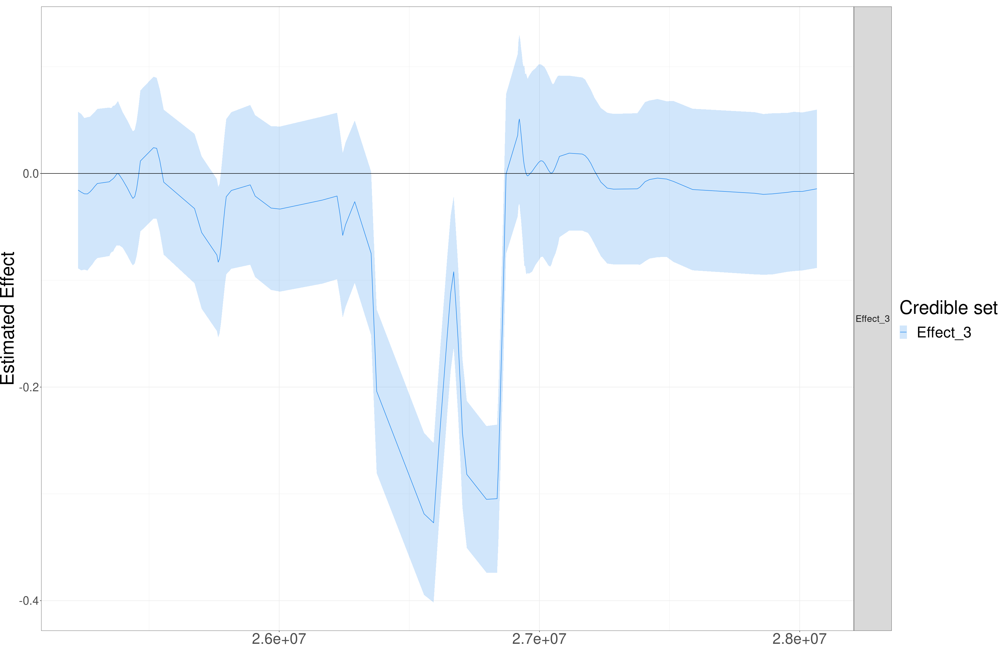

In [54]:
effect_extract_df
(Rda$tad653_3,3)%>%plot_effect()

In [55]:
Rda$tad653_3$cs


[[1]]
  chr7:26115779_G_A   chr7:26118516_C_A   chr7:26120838_A_G   chr7:26122454_G_A 
               2804                2813                2820                2822 
chr7:26110866_GCT_G   chr7:26114794_G_A 
               2781                2801 

[[2]]
chr7:25352952_C_T chr7:25352953_C_T 
              758               759 

[[3]]
chr7:26376793_A_G chr7:26377109_T_C 
             3244              3251 

[[4]]
    chr7:25711294_C_CT      chr7:25711298_A_T      chr7:25679184_T_C 
                  1991                   1992                   1887 
     chr7:25679195_C_T chr7:25687156_ATTTTT_A      chr7:25712172_A_G 
                  1888                   1913                   1996 
     chr7:25706025_A_G      chr7:25707180_G_T      chr7:25708504_G_T 
                  1975                   1977                   1981 
     chr7:25708772_T_C      chr7:25708880_A_G      chr7:25709345_C_T 
                  1983                   1986                   1987 
     chr7:25709790_A_T     chr7:25710567_C_CT      chr7:25710710_A_T 
                  1988                   1989                   1990 
     chr7:25711771_G_T      chr7:25713388_G_A     chr7:25761036_C_CA 
                  1994                   1997                   2141 
     chr7:25744186_G_A      chr7:25723809_T_C      chr7:25725672_A_G 
                  2098                   2026                   2032 
    chr7:25686138_C_CT      chr7:25686891_C_T      chr7:25686928_G_T 
                  1908                   1911                   1912 
     chr7:25687641_G_T      chr7:25687708_T_C      chr7:25687994_G_A 
                  1919                   1921                   1922 
  chr7:25688263_CAA_CA     chr7:25688451_GA_G      chr7:25688864_C_A 
                  1923                   1926                   1927 
     chr7:25689229_G_A      chr7:25689796_G_A      chr7:25694353_G_A 
                  1930                   1931                   1941 
     chr7:25697587_C_T      chr7:25699740_G_A      chr7:25700031_A_C 
                  1952                   1956                   1958 
     chr7:25701692_G_T     chr7:25715276_C_CT      chr7:25718675_T_C 
                  1964                   1999                   2003 
     chr7:25718977_C_T      chr7:25719488_A_T      chr7:25720367_G_A 
                  2004                   2007                   2009 
     chr7:25732318_C_T      chr7:25677221_T_C      chr7:25708820_A_C 
                  2063                   1875                   1985 
     chr7:25744045_G_T      chr7:25725710_A_G      chr7:25673976_G_A 
                  2095                   2033                   1860 
     chr7:25674319_G_A      chr7:25674818_T_C      chr7:25674857_C_T 
                  1861                   1862                   1863 
    chr7:25674935_CA_C     chr7:25675355_AG_A      chr7:25675391_G_A 
                  1864                   1866                   1867 
    chr7:25675699_AG_A      chr7:25675724_A_C      chr7:25675948_A_T 
                  1868                   1869                   1871 
     chr7:25676364_A_C      chr7:25676916_T_C      chr7:25677025_A_C 
                  1872                   1873                   1874 
     chr7:25677355_T_C      chr7:25677508_C_T      chr7:25677530_C_T 
                  1876                   1877                   1878 
     chr7:25677682_A_C      chr7:25678056_G_A      chr7:25678080_A_C 
                  1879                   1880                   1881 
     chr7:25678322_A_C      chr7:25678799_T_C      chr7:25678998_G_A 
                  1882                   1884                   1885 
     chr7:25679128_C_T      chr7:25679253_C_T 
                  1886                   1889

In [40]:
 color = c( "dodgerblue2", "green4", "#6A3D9A",
      "#FF7F00", "gold1", "skyblue2", "#FB9A99", "palegreen2",
      "#CAB2D6", "#FDBF6F", "gray70", "khaki2", "maroon", "orchid1",
      "deeppink1", "blue1", "steelblue4", "darkturquoise", "green1",
      "yellow4", "yellow3","darkorange4","brown","navyblue","#FF0000",
      "darkgreen","#FFFF00","purple","#00FF00","pink","#0000FF",
      "orange","#FF00FF","cyan","#00FFFF","#FFFFFF")

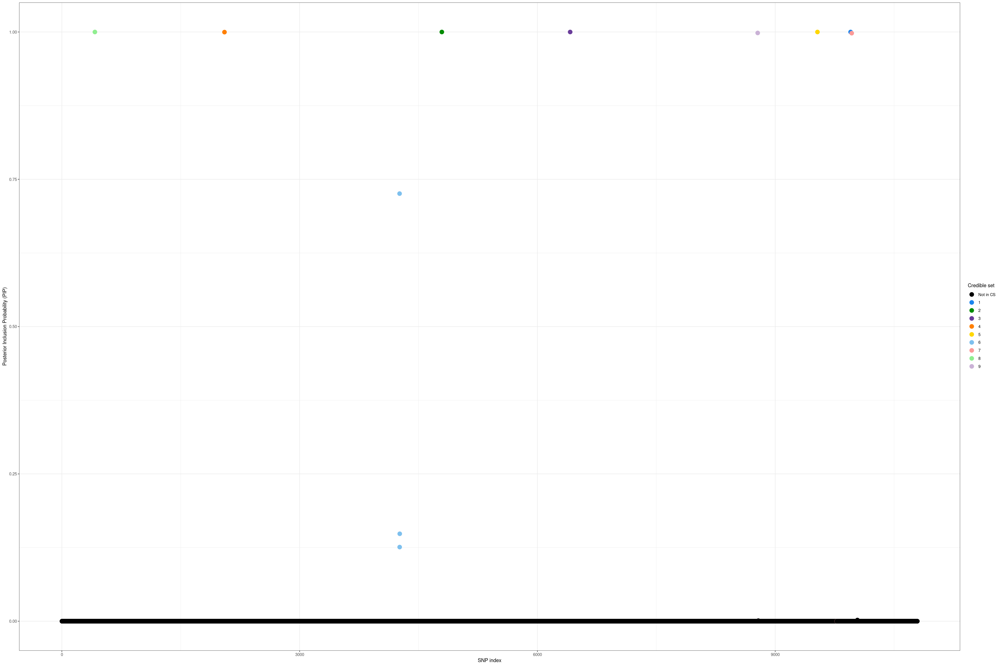

In [101]:
plot_susiF(Rda1$tad1217_5,pip_only = TRUE)+theme_bw()

## reprocessing raw data

In [104]:
a = readRDS("../3_two_peak_ha_rawdata.rds")
b = readRDS("../3_tad174_ha_rawdata.rds")

In [111]:
susiF_obj_ha2 =   readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/definitive_haQTL/haQTL.rosmap_haqtl.tad635.uni_Fsusie.mixture_normal_per_scale.rds")
genotype_ha2= readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/rerun/cache//fsusie.rosmap_haqtl.tad635.uni_Fsusie.mixture_normal_per_scale.rds")
susiF_obj_ha2$input_data = genotype_ha2$input_data

In [112]:
susiF_obj_ha2$cs

[[1]]
chr6:164859386_GAAA_G    chr6:164856006_G_A    chr6:164856022_T_C 
                11630                 11613                 11614 
   chr6:164856089_G_A    chr6:164856745_C_T    chr6:164856959_A_C 
                11615                 11618                 11619 
   chr6:164857509_G_A    chr6:164857721_C_T    chr6:164858131_G_C 
                11621                 11622                 11624 
   chr6:164858181_G_A    chr6:164858575_C_T    chr6:164858924_T_A 
                11625                 11626                 11628 

[[2]]
chr6:164555139_C_T 
             10586 

[[3]]
chr6:164931301_CACATAT_TACATAT 
                         12086 

[[4]]
chr6:163262490_C_T chr6:163262140_G_A chr6:163258480_G_A chr6:163258915_T_C 
              6528               6527               6521               6524 
chr6:163260351_A_G 
              6525 

[[5]]
chr6:161931626_T_C chr6:161927786_A_T chr6:161930106_A_G 
              1768               1757               1766 

[[6]]
                   chr6:163924327_C_T chr6:163927496_ACATGCATCAGGGTCAGCTC_A 
                                 8624                                  8645 
                   chr6:163925822_G_A                    chr6:163926782_C_T 
                                 8638                                  8642 
                   chr6:163927373_G_A                    chr6:163927994_G_A 
                                 8644                                  8649 
                   chr6:163928259_C_T                   chr6:163928576_GA_G 
                                 8650                                  8651 
                   chr6:163928769_T_C                    chr6:163929040_G_C 
                                 8653                                  8654 
                   chr6:163932029_G_A                    chr6:163933605_T_G 
                                 8664                                  8667 

[[7]]
chr6:162716786_GCACA_GCACACACACA 
                            4972 

[[8]]
chr6:164740554_TAAA_TA 
                 11269

In [110]:
a$tad653_3$cs

[[1]]
  chr7:26115779_G_A   chr7:26118516_C_A   chr7:26120838_A_G   chr7:26122454_G_A 
               2804                2813                2820                2822 
chr7:26110866_GCT_G   chr7:26114794_G_A 
               2781                2801 

[[2]]
chr7:25352952_C_T chr7:25352953_C_T 
              758               759 

[[3]]
chr7:26376793_A_G chr7:26377109_T_C 
             3244              3251 

[[4]]
    chr7:25711294_C_CT      chr7:25711298_A_T      chr7:25679184_T_C 
                  1991                   1992                   1887 
     chr7:25679195_C_T chr7:25687156_ATTTTT_A      chr7:25712172_A_G 
                  1888                   1913                   1996 
     chr7:25706025_A_G      chr7:25707180_G_T      chr7:25708504_G_T 
                  1975                   1977                   1981 
     chr7:25708772_T_C      chr7:25708880_A_G      chr7:25709345_C_T 
                  1983                   1986                   1987 
     chr7:25709790_A_T     chr7:25710567_C_CT      chr7:25710710_A_T 
                  1988                   1989                   1990 
     chr7:25711771_G_T      chr7:25713388_G_A     chr7:25761036_C_CA 
                  1994                   1997                   2141 
     chr7:25744186_G_A      chr7:25723809_T_C      chr7:25725672_A_G 
                  2098                   2026                   2032 
    chr7:25686138_C_CT      chr7:25686891_C_T      chr7:25686928_G_T 
                  1908                   1911                   1912 
     chr7:25687641_G_T      chr7:25687708_T_C      chr7:25687994_G_A 
                  1919                   1921                   1922 
  chr7:25688263_CAA_CA     chr7:25688451_GA_G      chr7:25688864_C_A 
                  1923                   1926                   1927 
     chr7:25689229_G_A      chr7:25689796_G_A      chr7:25694353_G_A 
                  1930                   1931                   1941 
     chr7:25697587_C_T      chr7:25699740_G_A      chr7:25700031_A_C 
                  1952                   1956                   1958 
     chr7:25701692_G_T     chr7:25715276_C_CT      chr7:25718675_T_C 
                  1964                   1999                   2003 
     chr7:25718977_C_T      chr7:25719488_A_T      chr7:25720367_G_A 
                  2004                   2007                   2009 
     chr7:25732318_C_T      chr7:25677221_T_C      chr7:25708820_A_C 
                  2063                   1875                   1985 
     chr7:25744045_G_T      chr7:25725710_A_G      chr7:25673976_G_A 
                  2095                   2033                   1860 
     chr7:25674319_G_A      chr7:25674818_T_C      chr7:25674857_C_T 
                  1861                   1862                   1863 
    chr7:25674935_CA_C     chr7:25675355_AG_A      chr7:25675391_G_A 
                  1864                   1866                   1867 
    chr7:25675699_AG_A      chr7:25675724_A_C      chr7:25675948_A_T 
                  1868                   1869                   1871 
     chr7:25676364_A_C      chr7:25676916_T_C      chr7:25677025_A_C 
                  1872                   1873                   1874 
     chr7:25677355_T_C      chr7:25677508_C_T      chr7:25677530_C_T 
                  1876                   1877                   1878 
     chr7:25677682_A_C      chr7:25678056_G_A      chr7:25678080_A_C 
                  1879                   1880                   1881 
     chr7:25678322_A_C      chr7:25678799_T_C      chr7:25678998_G_A 
                  1882                   1884                   1885 
     chr7:25679128_C_T      chr7:25679253_C_T 
                  1886                   1889

In [113]:
a$tad1217_5$cs

[[1]]
chr15:92734199_C_G 
              9951 

[[2]]
chr15:91104210_T_G 
              4794 

[[3]]
chr15:91664536_A_C 
              6413 

[[4]]
chr15:90295161_C_T 
              2052 

[[5]]
chr15:92624920_G_A 
              9533 

[[6]]
chr15:90955016_A_C chr15:90955063_G_A chr15:90955051_C_T 
              4261               4263               4262 

[[7]]
chr15:92737247_G_T chr15:92703941_A_G chr15:92704183_C_T 
              9965               9775               9776 

[[8]]
chr15:89751058_T_G 
               417 

[[9]]
chr15:92443849_T_A 
              8779

In [109]:
b$tad174_1$cred_band

up,0.02044402,0.04170973,0.014699346,0.03524255,0.01687114,-0.006151244,0.003025124,0.011227029,0.008847134,0.002229410,⋯,0.002581524,0.004795866,0.005158033,0.002902777,0.01433319,0.01483559,0.01319480,0.02574496,0.02564163,0.03122159
low,-0.02560587,-0.04787667,-0.006991033,-0.02274633,-0.02143897,-0.010629671,-0.006529857,-0.001751316,-0.002657164,-0.002089347,⋯,-0.002987067,-0.004754882,-0.005044707,-0.002699303,-0.01379566,-0.01458896,-0.01426583,-0.02663058,-0.02313356,-0.02860730
up,0.05892829,0.06421177,0.05635248,0.05921477,0.05570285,0.05209483,0.05135469,0.05063606,0.04935058,0.04769317,⋯,0.05599399,0.05690566,0.05700930,0.05662905,0.05902870,0.05905473,0.05827107,0.06276827,0.05949706,0.06165316
low,0.04009324,0.03426523,0.04133337,0.03754310,0.03976098,0.04182252,0.04094295,0.03970721,0.03868592,0.03777639,⋯,0.04498502,0.04425374,0.04426194,0.04467607,0.04223014,0.04206102,0.04259410,0.03777784,0.04068066,0.03808509
up,0.008421145,0.01159725,-0.00169152,0.002439125,-0.002872814,-0.009768254,-0.01047408,-0.01071574,-0.01141701,-0.01247727,⋯,0.04803499,0.06314993,0.06895399,0.06568430,0.06329361,0.05361644,0.04210724,0.03771648,0.022827656,0.017606178
low,-0.010771869,-0.02163170,-0.01255079,-0.019338066,-0.017187032,-0.013251088,-0.01471018,-0.01602938,-0.01609048,-0.01501880,⋯,0.04299057,0.05569056,0.06058344,0.05999898,0.04836052,0.03815388,0.02784899,0.01026773,0.004236271,-0.007770543
up,0.001897586,0.001553274,0.0010992452,0.0007106028,0.0005819526,0.0006471035,0.0007438562,0.0007899564,0.0007749514,0.0007504131,⋯,0.001622438,0.002997075,0.003098791,0.002307085,0.001430008,0.0011127907,0.001444817,0.0017792823,0.002013284,0.002065537
low,-0.001173312,-0.001043095,-0.0008500882,-0.0007377817,-0.0008671247,-0.0011488884,-0.0014020060,-0.0015161763,-0.0014675574,-0.0013205490,⋯,-0.002097858,-0.003369384,-0.003305729,-0.002306095,-0.001203573,-0.0006612659,-0.000791862,-0.0009757853,-0.001133518,-0.001209284
up,0.0002622934,0.002062827,0.003309199,0.001911071,0.0004985835,0.0007708272,5.796019e-05,0.0002168180,3.371995e-05,4.766560e-05,⋯,4.644113e-05,0.0001117575,0.0001033361,0.0001833447,0.0003637294,0.0004567612,0.0007683337,0.0005951108,0.0008401252,0.0009248090
low,-0.0013905450,-0.001358201,-0.003222697,-0.002128349,-0.0005311068,-0.0006800635,-8.519200e-05,-0.0002135004,-3.122017e-05,-5.207409e-05,⋯,-4.340619e-05,-0.0001158547,-0.0001115736,-0.0001835232,-0.0003316479,-0.0004462426,-0.0008447473,-0.0006570103,-0.0007555457,-0.0003847583


In [108]:
Rda2$tad174_1$cred_band

up,0.05892829,0.06421177,0.05635248,0.05921477,0.05570285,0.05209483,0.05135469,0.05063606,0.04935058,0.04769317,⋯,0.05599399,0.05690566,0.05700930,0.05662905,0.05902870,0.05905473,0.05827107,0.06276827,0.05949706,0.06165316
low,0.04009324,0.03426523,0.04133337,0.03754310,0.03976098,0.04182252,0.04094295,0.03970721,0.03868592,0.03777639,⋯,0.04498502,0.04425374,0.04426194,0.04467607,0.04223014,0.04206102,0.04259410,0.03777784,0.04068066,0.03808509
up,0.001897586,0.001553274,0.0010992452,0.0007106028,0.0005819526,0.0006471035,0.0007438562,0.0007899564,0.0007749514,0.0007504131,⋯,0.001622438,0.002997075,0.003098791,0.002307085,0.001430008,0.0011127907,0.001444817,0.0017792823,0.002013284,0.002065537
low,-0.001173312,-0.001043095,-0.0008500882,-0.0007377817,-0.0008671247,-0.0011488884,-0.0014020060,-0.0015161763,-0.0014675574,-0.0013205490,⋯,-0.002097858,-0.003369384,-0.003305729,-0.002306095,-0.001203573,-0.0006612659,-0.000791862,-0.0009757853,-0.001133518,-0.001209284


In [114]:
list(tad174_1 = b$tad174_1, tad635_3 = susiF_obj_ha2, tad1217_5 = a$tad1217_5 )%>%saveRDS("corrected_2_peak_rawdata.rds")

In [115]:
tad174_1 =attach("refined_tad174_ha_haQTL (1).RData")

The following object is masked from file:refined_tad174_ha_haQTL.RData (pos = 3):

    tad174_1


The following object is masked from file:refined_tad174_ha_haQTL.RData (pos = 4):

    tad174_1


The following object is masked from file:refined_tad174_ha_haQTL.RData (pos = 8):

    tad174_1


The following object is masked from file:refined_tad174_ha_haQTL.RData (pos = 12):

    tad174_1


The following object is masked from file:refined_tad174_ha_haQTL.RData (pos = 22):

    tad174_1




In [120]:
tad635 = attach("refined_tad653_3 (1).RData")

The following object is masked from file:refined_tad653_3.RData (pos = 7):

    tad653_3


The following object is masked from file:refined_tad653_3.RData (pos = 11):

    tad653_3


The following object is masked from file:refined_tad653_3.RData (pos = 14):

    tad653_3




In [121]:
tad635$tad653_3$cs

[[1]]
  chr7:26115779_G_A   chr7:26118516_C_A   chr7:26120838_A_G   chr7:26122454_G_A 
               2804                2813                2820                2822 
chr7:26110866_GCT_G   chr7:26114794_G_A 
               2781                2801 

[[2]]
chr7:25352952_C_T chr7:25352953_C_T 
              758               759 

[[3]]
chr7:26376793_A_G chr7:26377109_T_C 
             3244              3251 

[[4]]
    chr7:25711294_C_CT      chr7:25711298_A_T      chr7:25679184_T_C 
                  1991                   1992                   1887 
     chr7:25679195_C_T chr7:25687156_ATTTTT_A      chr7:25712172_A_G 
                  1888                   1913                   1996 
     chr7:25706025_A_G      chr7:25707180_G_T      chr7:25708504_G_T 
                  1975                   1977                   1981 
     chr7:25708772_T_C      chr7:25708880_A_G      chr7:25709345_C_T 
                  1983                   1986                   1987 
     chr7:25709790_A_T     chr7:25710567_C_CT      chr7:25710710_A_T 
                  1988                   1989                   1990 
     chr7:25711771_G_T      chr7:25713388_G_A     chr7:25761036_C_CA 
                  1994                   1997                   2141 
     chr7:25744186_G_A      chr7:25723809_T_C      chr7:25725672_A_G 
                  2098                   2026                   2032 
    chr7:25686138_C_CT      chr7:25686891_C_T      chr7:25686928_G_T 
                  1908                   1911                   1912 
     chr7:25687641_G_T      chr7:25687708_T_C      chr7:25687994_G_A 
                  1919                   1921                   1922 
  chr7:25688263_CAA_CA     chr7:25688451_GA_G      chr7:25688864_C_A 
                  1923                   1926                   1927 
     chr7:25689229_G_A      chr7:25689796_G_A      chr7:25694353_G_A 
                  1930                   1931                   1941 
     chr7:25697587_C_T      chr7:25699740_G_A      chr7:25700031_A_C 
                  1952                   1956                   1958 
     chr7:25701692_G_T     chr7:25715276_C_CT      chr7:25718675_T_C 
                  1964                   1999                   2003 
     chr7:25718977_C_T      chr7:25719488_A_T      chr7:25720367_G_A 
                  2004                   2007                   2009 
     chr7:25732318_C_T      chr7:25677221_T_C      chr7:25708820_A_C 
                  2063                   1875                   1985 
     chr7:25744045_G_T      chr7:25725710_A_G      chr7:25673976_G_A 
                  2095                   2033                   1860 
     chr7:25674319_G_A      chr7:25674818_T_C      chr7:25674857_C_T 
                  1861                   1862                   1863 
    chr7:25674935_CA_C     chr7:25675355_AG_A      chr7:25675391_G_A 
                  1864                   1866                   1867 
    chr7:25675699_AG_A      chr7:25675724_A_C      chr7:25675948_A_T 
                  1868                   1869                   1871 
     chr7:25676364_A_C      chr7:25676916_T_C      chr7:25677025_A_C 
                  1872                   1873                   1874 
     chr7:25677355_T_C      chr7:25677508_C_T      chr7:25677530_C_T 
                  1876                   1877                   1878 
     chr7:25677682_A_C      chr7:25678056_G_A      chr7:25678080_A_C 
                  1879                   1880                   1881 
     chr7:25678322_A_C      chr7:25678799_T_C      chr7:25678998_G_A 
                  1882                   1884                   1885 
     chr7:25679128_C_T      chr7:25679253_C_T 
                  1886                   1889

In [122]:
Rda$tad653_3$cs

[[1]]
  chr7:26115779_G_A   chr7:26118516_C_A   chr7:26120838_A_G   chr7:26122454_G_A 
               2804                2813                2820                2822 
chr7:26110866_GCT_G   chr7:26114794_G_A 
               2781                2801 

[[2]]
chr7:25352952_C_T chr7:25352953_C_T 
              758               759 

[[3]]
chr7:26376793_A_G chr7:26377109_T_C 
             3244              3251 

[[4]]
    chr7:25711294_C_CT      chr7:25711298_A_T      chr7:25679184_T_C 
                  1991                   1992                   1887 
     chr7:25679195_C_T chr7:25687156_ATTTTT_A      chr7:25712172_A_G 
                  1888                   1913                   1996 
     chr7:25706025_A_G      chr7:25707180_G_T      chr7:25708504_G_T 
                  1975                   1977                   1981 
     chr7:25708772_T_C      chr7:25708880_A_G      chr7:25709345_C_T 
                  1983                   1986                   1987 
     chr7:25709790_A_T     chr7:25710567_C_CT      chr7:25710710_A_T 
                  1988                   1989                   1990 
     chr7:25711771_G_T      chr7:25713388_G_A     chr7:25761036_C_CA 
                  1994                   1997                   2141 
     chr7:25744186_G_A      chr7:25723809_T_C      chr7:25725672_A_G 
                  2098                   2026                   2032 
    chr7:25686138_C_CT      chr7:25686891_C_T      chr7:25686928_G_T 
                  1908                   1911                   1912 
     chr7:25687641_G_T      chr7:25687708_T_C      chr7:25687994_G_A 
                  1919                   1921                   1922 
  chr7:25688263_CAA_CA     chr7:25688451_GA_G      chr7:25688864_C_A 
                  1923                   1926                   1927 
     chr7:25689229_G_A      chr7:25689796_G_A      chr7:25694353_G_A 
                  1930                   1931                   1941 
     chr7:25697587_C_T      chr7:25699740_G_A      chr7:25700031_A_C 
                  1952                   1956                   1958 
     chr7:25701692_G_T     chr7:25715276_C_CT      chr7:25718675_T_C 
                  1964                   1999                   2003 
     chr7:25718977_C_T      chr7:25719488_A_T      chr7:25720367_G_A 
                  2004                   2007                   2009 
     chr7:25732318_C_T      chr7:25677221_T_C      chr7:25708820_A_C 
                  2063                   1875                   1985 
     chr7:25744045_G_T      chr7:25725710_A_G      chr7:25673976_G_A 
                  2095                   2033                   1860 
     chr7:25674319_G_A      chr7:25674818_T_C      chr7:25674857_C_T 
                  1861                   1862                   1863 
    chr7:25674935_CA_C     chr7:25675355_AG_A      chr7:25675391_G_A 
                  1864                   1866                   1867 
    chr7:25675699_AG_A      chr7:25675724_A_C      chr7:25675948_A_T 
                  1868                   1869                   1871 
     chr7:25676364_A_C      chr7:25676916_T_C      chr7:25677025_A_C 
                  1872                   1873                   1874 
     chr7:25677355_T_C      chr7:25677508_C_T      chr7:25677530_C_T 
                  1876                   1877                   1878 
     chr7:25677682_A_C      chr7:25678056_G_A      chr7:25678080_A_C 
                  1879                   1880                   1881 
     chr7:25678322_A_C      chr7:25678799_T_C      chr7:25678998_G_A 
                  1882                   1884                   1885 
     chr7:25679128_C_T      chr7:25679253_C_T 
                  1886                   1889

In [116]:
tad174_1$tad174_1$cs

[[1]]
chr2:86208944_C_A 
             2204 

[[2]]
                           chr2:85902843_A_AT 
                                         1490 
chr2:85917782_GATAAATAA_GATAAATAAATAAATAAATAA 
                                         1567 

[[3]]
   chr2:86703843_G_T chr2:86703126_CA_CAA    chr2:86696055_A_G 
                3174                 3173                 3163 

[[4]]
chr2:85843250_A_G chr2:85843251_T_C chr2:85844729_A_T chr2:85844741_G_A 
             1271              1272              1276              1277 
chr2:85862550_A_T chr2:85863908_C_T chr2:85868556_C_G chr2:85872482_C_A 
             1342              1347              1363              1384 
chr2:85905908_T_C chr2:85893855_C_G chr2:85898176_G_A chr2:85874897_T_A 
             1510              1459              1476              1394 

[[5]]
            chr2:85537843_A_T             chr2:85537845_T_G 
                          457                           458 
            chr2:85533868_C_G             chr2:85538318_T_G 
                          442                           461 
            chr2:85578531_G_A             chr2:85582547_C_T 
                          559                           570 
            chr2:85582580_T_G             chr2:85542852_A_G 
                          571                           466 
            chr2:85550147_G_A             chr2:85576774_T_C 
                          480                           555 
          chr2:85547705_CAG_C             chr2:85535086_T_C 
                          476                           447 
            chr2:85579143_C_T             chr2:85574779_C_T 
                          561                           540 
          chr2:85526342_TTG_T            chr2:85529943_TG_T 
                          408                           424 
            chr2:85546536_A_G             chr2:85528016_C_T 
                          473                           418 
            chr2:85539422_C_T             chr2:85553008_G_A 
                          462                           483 
            chr2:85554900_G_A             chr2:85560000_C_T 
                          489                           495 
            chr2:85574841_T_A          chr2:85529922_GA_GAA 
                          541                           422 
            chr2:85525351_A_C             chr2:85531229_C_T 
                          404                           432 
            chr2:85526430_G_A             chr2:85526683_C_A 
                          409                           410 
            chr2:85526724_C_T             chr2:85565281_A_T 
                          411                           509 
           chr2:85532467_T_TG             chr2:85565285_A_T 
                          440                           510 
        chr2:85559719_AAAAG_A chr2:85586580_AAAAC_AAAACAAAC 
                          494                           587 
            chr2:85510887_C_A 
                          365

New names:
• `` -> `...1`


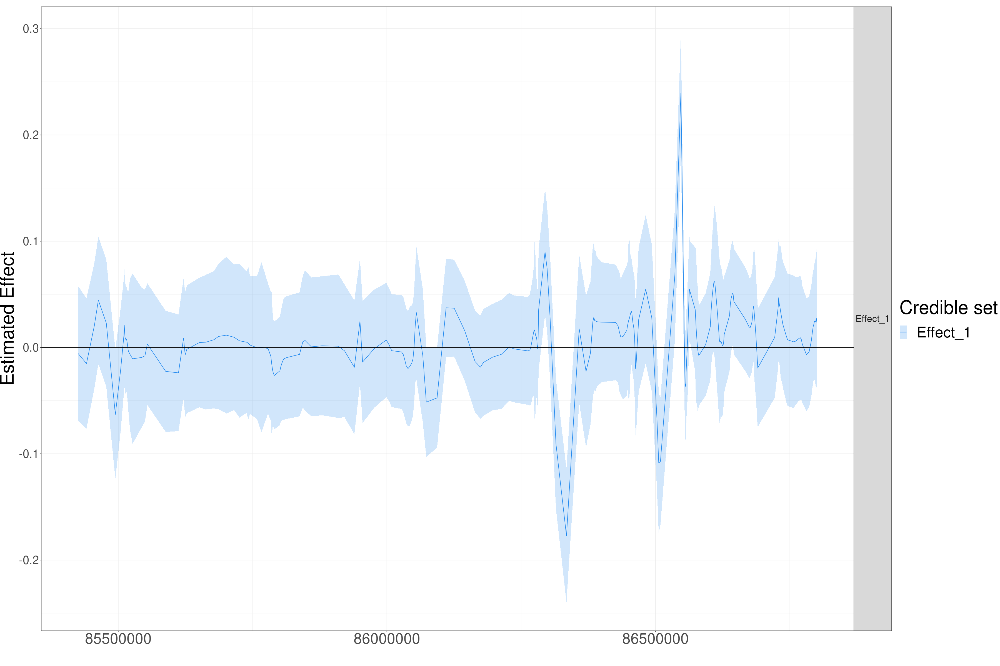

In [123]:
effect_extract_df(tad174_1$tad174_1,1)%>%plot_effect()

In [124]:
effect_extract_df

function(fsusie,n = 1:length(fsusie$fitted_func) ){
    color = c("black", "dodgerblue2", "green4", "#6A3D9A",
      "#FF7F00", "gold1", "skyblue2", "#FB9A99", "palegreen2",
      "#CAB2D6", "#FDBF6F", "gray70", "khaki2", "maroon", "orchid1",
      "deeppink1", "blue1", "steelblue4", "darkturquoise", "green1",
      "yellow4", "yellow3","darkorange4","brown","navyblue","#FF0000",
      "darkgreen","#FFFF00","purple","#00FF00","pink","#0000FF",
      "orange","#FF00FF","cyan","#00FFFF","#FFFFFF")
    ## Define Function
    ## Define Function

    fsusie = update_cal_credible_band2(fsusie)
     plot_df = ((fsusie$fitted_func[n])%>%as_tibble(.name_repair = "universal")%>%mutate(pos =  fsusie$outing_grid)%>%`colnames<-`(c(paste0("Effect_",n,":mid"),"pos"))%>%mutate(`#chr` = str_split(names(fsusie$csd_X)[[1]],":")[[1]][[1]] ))%>%dplyr::select(`#chr`, pos, everything())
    plot_df = cbind(plot_df ,t(Reduce(rbind,fsusie$cred_band[n]))  )
    plot_df = plot_df%>%pivot_longer(cols = 3:ncol(plot_df), names_to = c("effect",".value"),names_prefix = "" , names_sep = ":") 
   
     return(plot_df)
     }
<bytecode: 0x5584cbedf5f8>

In [125]:
update_cal_credible_band2 = function (susiF.obj) 
{
    for (i in 1:susiF.obj$L) {
        rownames(susiF.obj$cred_band[[i]]) = paste0("Effect_", 
            i, ":", rownames(susiF.obj$cred_band[[i]]))
    }
    return(susiF.obj)
}

function(susiF.obj )
    {
    for (i in 1:susiF.obj$L){
    rownames(susiF.obj$cred_band[[i]]) = paste0("Effect_",i,":",rownames(susiF.obj$cred_band[[i]]))

    }
    
      return(susiF.obj)
    }
<bytecode: 0x5584cd6484a0>

## Raw data + effect size

In [126]:
Rda1$tad1217_5$cs

[[1]]
chr15:92734199_C_G 
              9951 

[[2]]
chr15:91104210_T_G 
              4794 

[[3]]
chr15:91664536_A_C 
              6413 

[[4]]
chr15:90295161_C_T 
              2052 

[[5]]
chr15:92624920_G_A 
              9533 

[[6]]
chr15:90955016_A_C chr15:90955063_G_A chr15:90955051_C_T 
              4261               4263               4262 

[[7]]
chr15:92737247_G_T chr15:92703941_A_G chr15:92704183_C_T 
              9965               9775               9776 

[[8]]
chr15:89751058_T_G 
               417 

[[9]]
chr15:92443849_T_A 
              8779

In [129]:
tad1217_5_h = Rda1$tad1217_5$input_data

New names:
• `` -> `...1`


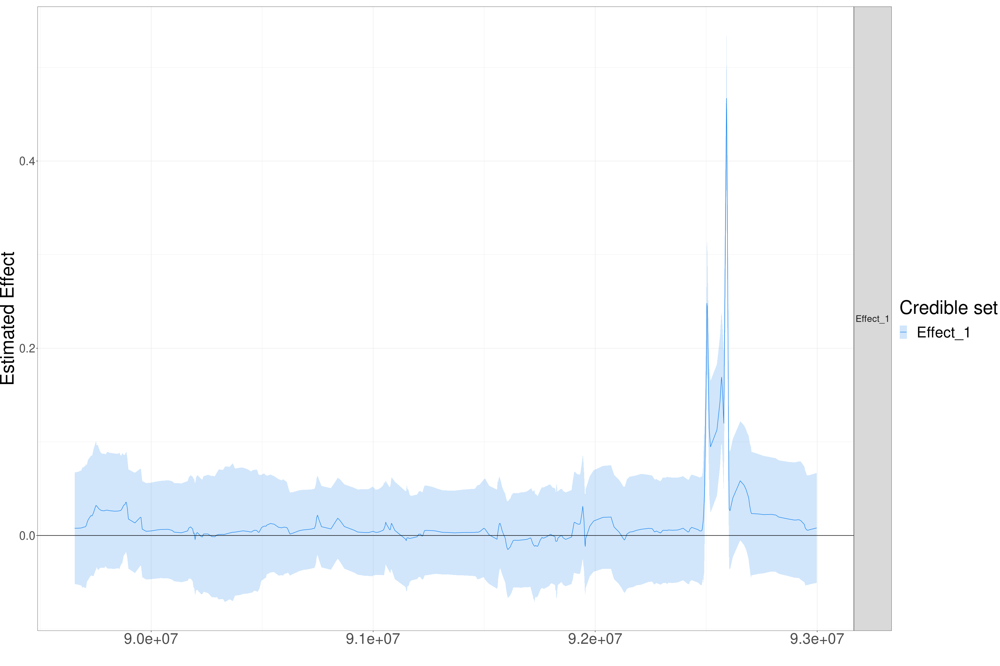

In [134]:
effect_extract_df(Rda1$tad1217_5,1)%>%plot_effect()

In [135]:
h_1217_resid_plot_box = read_delim("~/GIT/neuro-mQTL/notebook/3_1217_1_rawdata_plot.tsv","\t")

Rows: 159840 Columns: 3
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
dbl (3): X, peak, count

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


New names:
• `` -> `...1`
Warning message:
“Removed 1 rows containing non-finite values (`stat_summary()`).”


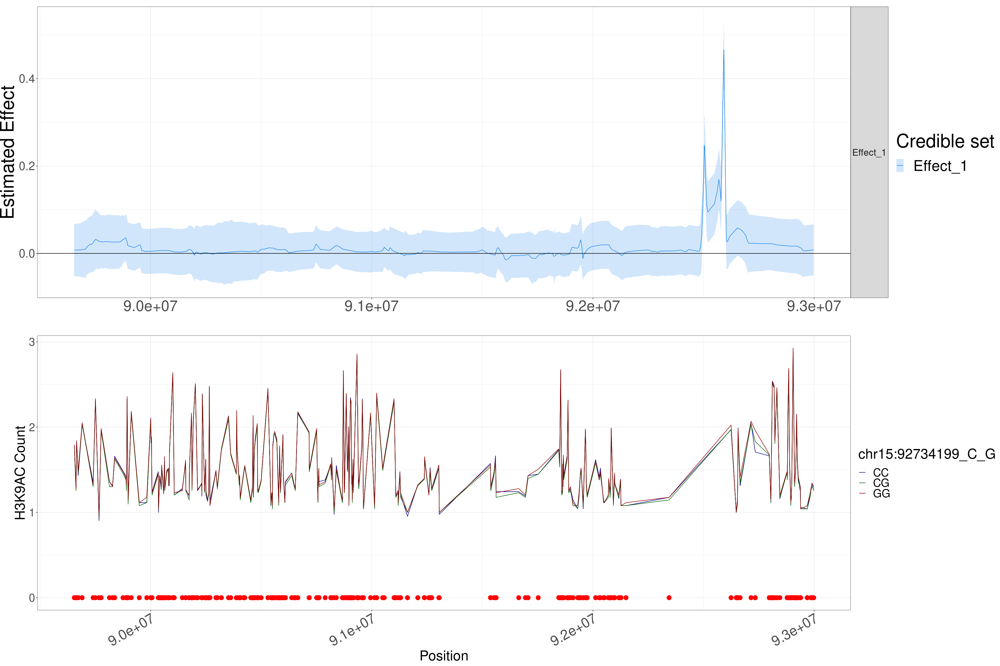

In [147]:
cowplot::plot_grid(plotlist = list(effect_extract_df(Rda1$tad1217_5,1)%>%plot_effect, median_plot+geom_point(x = 86208944, y = 0, color = "green", size = 5)#+
                                           #geom_segment(aes(x = 86280000, xend = 86346346, y = 0.5, yend = 0.5 ), color = "red" )+
                                          # geom_segment(aes(x = (86438737+86511107)/2, xend = 86520000, y = 0.5, yend = 0.5 ), color = "red" )+
                                         #  geom_segment(aes(x = 86583488,xend = 86600000, y = 0.5, yend = 0.5 ), color = "red" )

                                   
                                  
                                  
                                  ),ncol = 1, align = "v",axis = "tlbr",rel_heights = c(6,6)) 

In [137]:
within = function(x,y,z){ return(x >= y & x <= z)}

In [146]:
median_plot = h_1217_resid_plot_box%>%filter( )%>%mutate(peak = as.character(peak),peak_pos = as.numeric(peak), count = log10(count),group = case_when(peak_pos%>%within(85828028,85828028)~1,peak_pos%>%within(86358373,86358373)~2,peak_pos%>%within(86595475,86595475)~3 , .default = 0) )%>%filter( )%>%mutate( `chr15:92734199_C_G` = case_when(X ==0~ "CC", X ==1 ~ "CG", X == 2 ~ "GG" ), peak_pos = as.numeric(peak))%>%
    ggplot(aes(x = peak_pos, color = `chr15:92734199_C_G`, y = count ))+
    #geom_boxplot(aes(x = peak, fill = `chr15:92734199_C_G`, y = count ),position=position_dodge(1), size = 0.3,color = "black" , alpha = 0.1)+
    stat_summary(fun=median, geom="line", aes(group = X ,color = `chr15:92734199_C_G`,x = peak_pos),size = 0.5)+#facet_grid(.~group,scale = "free_y") +
    geom_point(aes( x = peak%>%as.numeric, y = 0), color = "red", size = 4 )+
    theme_bw()+theme(text = element_text(size = 30),panel.background = element_rect(), axis.text.x =  element_text(angle = 30,  hjust=1,size = 30))+
    xlab("")+ylab("H3K9AC Count")+ xlab("Position")+scale_fill_discrete(type = c("darkblue","darkgreen","darkred"))+scale_color_discrete(type = c("darkblue","darkgreen","darkred"))#+  scale_x_discrete(breaks = function(x){x[c(TRUE, T)]})

Warning message:
“Removed 1 rows containing non-finite values (`stat_summary()`).”


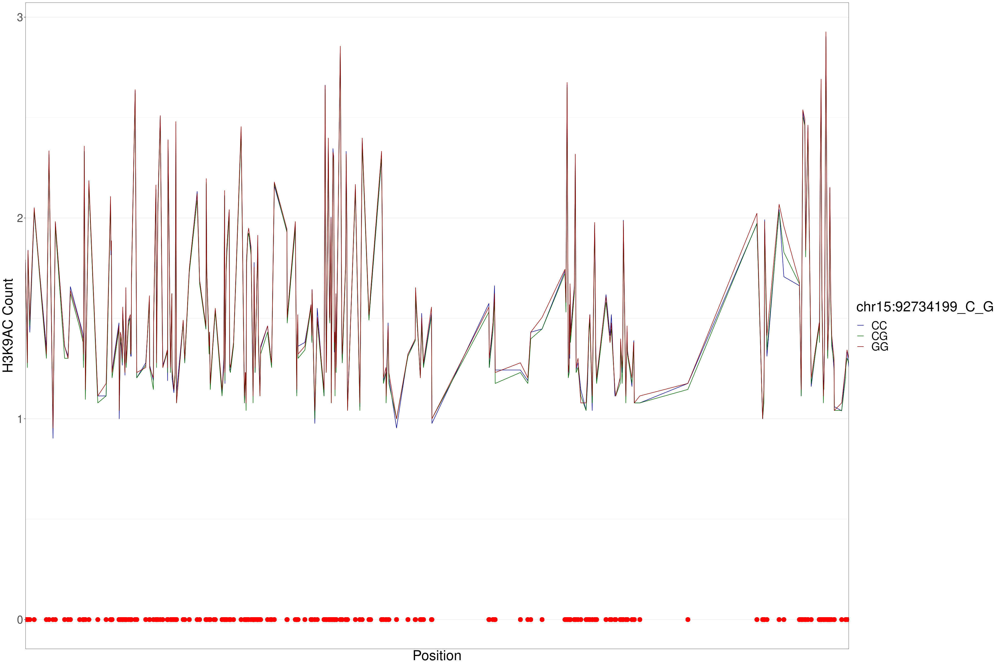

In [142]:
median_plot 

In [ ]:
cowplot::plot_grid(plotlist = list(effect_extract_df(tad174_1$tad174_1,1)%>%plot_effect, median_plot+geom_point(x = 92734199, y = 0, color = "green", size = 5)+
                                          # geom_segment(aes(x = 86280000, xend = 86346346, y = 0.5, yend = 0.5 ), color = "red" )+
                                           #geom_segment(aes(x = (86438737+86511107)/2, xend = 86520000, y = 0.5, yend = 0.5 ), color = "red" )+
                                           geom_segment(aes(x = 86583488,xend = 86600000, y = 0.5, yend = 0.5 ), color = "red" ),

                                  
                                  ),ncol = 1, align = "v",axis = "tlbr",rel_heights = c(6,6)) 

In [148]:
h_1217_resid_plot_box = read_delim("~/GIT/neuro-mQTL/notebook/3_1217_5_rawdata_plot.tsv","\t")

Rows: 159840 Columns: 3
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
dbl (3): X, peak, count

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


Warning message:
“Removed 1 rows containing non-finite values (`stat_summary()`).”


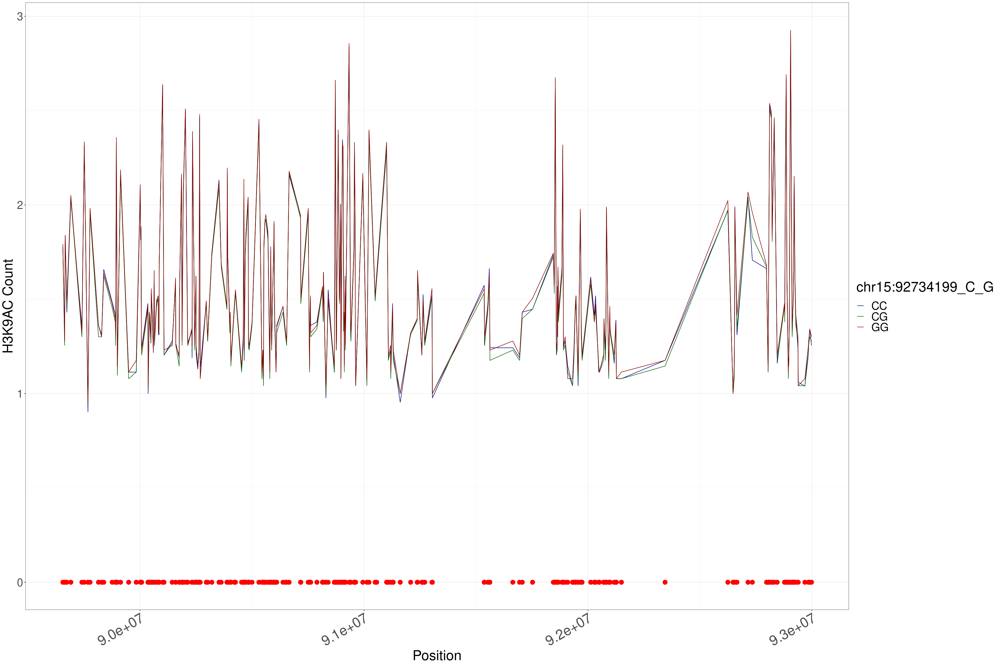

In [149]:
h_1217_resid_plot_box%>%filter( )%>%mutate(peak = as.character(peak),peak_pos = as.numeric(peak), count = log10(count),group = case_when(peak_pos%>%within(85828028,85828028)~1,peak_pos%>%within(86358373,86358373)~2,peak_pos%>%within(86595475,86595475)~3 , .default = 0) )%>%filter( )%>%mutate( `chr15:92734199_C_G` = case_when(X ==0~ "CC", X ==1 ~ "CG", X == 2 ~ "GG" ), peak_pos = as.numeric(peak))%>%
    ggplot(aes(x = peak_pos, color = `chr15:92734199_C_G`, y = count ))+
    #geom_boxplot(aes(x = peak, fill = `chr15:92734199_C_G`, y = count ),position=position_dodge(1), size = 0.3,color = "black" , alpha = 0.1)+
    stat_summary(fun=median, geom="line", aes(group = X ,color = `chr15:92734199_C_G`,x = peak_pos),size = 0.5)+#facet_grid(.~group,scale = "free_y") +
    geom_point(aes( x = peak%>%as.numeric, y = 0), color = "red", size = 4 )+
    theme_bw()+theme(text = element_text(size = 30),panel.background = element_rect(), axis.text.x =  element_text(angle = 30,  hjust=1,size = 30))+
    xlab("")+ylab("H3K9AC Count")+ xlab("Position")+scale_fill_discrete(type = c("darkblue","darkgreen","darkred"))+scale_color_discrete(type = c("darkblue","darkgreen","darkred"))#+  scale_x_discrete(breaks = function(x){x[c(TRUE, T)]})

In [150]:
Rda1$tad1217_5$cs

[[1]]
chr15:92734199_C_G 
              9951 

[[2]]
chr15:91104210_T_G 
              4794 

[[3]]
chr15:91664536_A_C 
              6413 

[[4]]
chr15:90295161_C_T 
              2052 

[[5]]
chr15:92624920_G_A 
              9533 

[[6]]
chr15:90955016_A_C chr15:90955063_G_A chr15:90955051_C_T 
              4261               4263               4262 

[[7]]
chr15:92737247_G_T chr15:92703941_A_G chr15:92704183_C_T 
              9965               9775               9776 

[[8]]
chr15:89751058_T_G 
               417 

[[9]]
chr15:92443849_T_A 
              8779

New names:
• `` -> `...1`
Warning message:
“Removed 1 rows containing non-finite values (`stat_summary()`).”


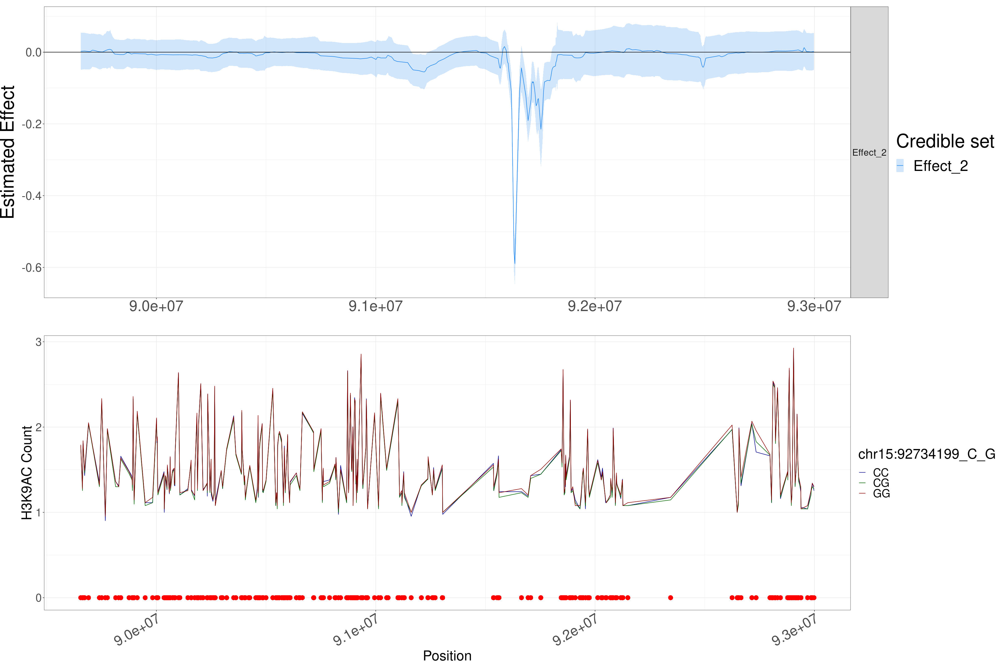

In [152]:
cowplot::plot_grid(plotlist = list(effect_extract_df(Rda1$tad1217_5,2)%>%plot_effect, median_plot#+geom_point(x = 86208944, y = 0, color = "green", size = 5)#+
                                           #geom_segment(aes(x = 86280000, xend = 86346346, y = 0.5, yend = 0.5 ), color = "red" )+
                                          # geom_segment(aes(x = (86438737+86511107)/2, xend = 86520000, y = 0.5, yend = 0.5 ), color = "red" )+
                                         #  geom_segment(aes(x = 86583488,xend = 86600000, y = 0.5, yend = 0.5 ), color = "red" )

                                   
                                  
                                  
                                  ),ncol = 1, align = "v",axis = "tlbr",rel_heights = c(6,6)) 

In [153]:
h_1217_resid_plot_box = read_delim("~/GIT/neuro-mQTL/notebook/3_1217_2_rawdata_plot.tsv","\t")

Rows: 159840 Columns: 3
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
dbl (3): X, peak, count

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [155]:
median_plot = h_1217_resid_plot_box%>%filter( )%>%mutate(peak = as.character(peak),peak_pos = as.numeric(peak), count = log10(count),group = case_when(peak_pos%>%within(85828028,85828028)~1,peak_pos%>%within(86358373,86358373)~2,peak_pos%>%within(86595475,86595475)~3 , .default = 0) )%>%filter( )%>%mutate( `chr15:92734199_C_G` = case_when(X ==0~ "CC", X ==1 ~ "CG", X == 2 ~ "GG" ), peak_pos = as.numeric(peak))%>%
    ggplot(aes(x = peak_pos, color = `chr15:92734199_C_G`, y = count ))+
    #geom_boxplot(aes(x = peak, fill = `chr15:92734199_C_G`, y = count ),position=position_dodge(1), size = 0.3,color = "black" , alpha = 0.1)+
    stat_summary(fun=median, geom="line", aes(group = X ,color = `chr15:92734199_C_G`,x = peak_pos),size = 0.5)+#facet_grid(.~group,scale = "free_y") +
    geom_point(aes( x = peak%>%as.numeric, y = 0), color = "red", size = 4 )+
    theme_bw()+theme(text = element_text(size = 30),panel.background = element_rect(), axis.text.x =  element_text(angle = 30,  hjust=1,size = 30))+
    xlab("")+ylab("H3K9AC Count")+ xlab("Position")+scale_fill_discrete(type = c("darkblue","darkgreen","darkred"))+scale_color_discrete(type = c("darkblue","darkgreen","darkred")) + #+  scale_x_discrete(breaks = function(x){x[c(TRUE, T)]})

In [170]:
plot_range

[1] 89655155 92998046

New names:
• `` -> `...1`
Warning message:
“Removed 1 rows containing non-finite values (`stat_summary()`).”


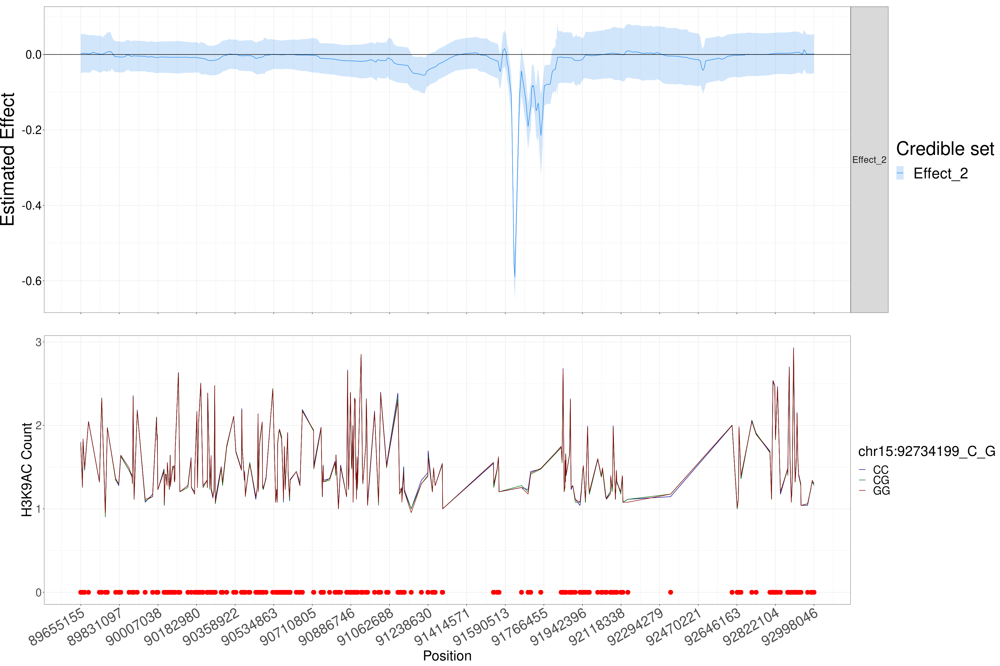

In [174]:
cowplot::plot_grid(plotlist = list(effect_extract_df(Rda1$tad1217_5,2)%>%plot_effect+  scale_x_continuous(breaks = seq(plot_range[1],plot_range[2],length.out = 20), limits = plot_range)+theme(axis.text = element_blank()) ,
                                   median_plot+  scale_x_continuous(breaks = seq(plot_range[1],plot_range[2],length.out = 20), limits = plot_range) #+geom_point(x = 86208944, y = 0, color = "green", size = 5)#+
                                           #geom_segment(aes(x = 86280000, xend = 86346346, y = 0.5, yend = 0.5 ), color = "red" )+
                                          # geom_segment(aes(x = (86438737+86511107)/2, xend = 86520000, y = 0.5, yend = 0.5 ), color = "red" )+
                                         #  geom_segment(aes(x = 86583488,xend = 86600000, y = 0.5, yend = 0.5 ), color = "red" )

                                   
                                  
                                  
                                  ),ncol = 1, align = "v",axis = "tlbr",rel_heights = c(6,6)) 

In [175]:
(9159+9176)/2

[1] 9167.5

In [188]:
median_plot1 = h_1217_resid_plot_box%>%filter( )%>%mutate(peak = as.character(peak),peak_pos = as.numeric(peak), count = log10(count),group = case_when(peak_pos%>%within(9.16e+7,9.1675e+7)~1,peak_pos%>%within(9.1675e+7,9.177e+7)~2, .default = 0) )%>%filter( )%>%mutate( `chr15:91104210_T_G` = case_when(X ==0~ "TT", X ==1 ~ "TG", X == 2 ~ "GG" ), peak_pos = as.numeric(peak))%>%
    ggplot(aes(x = peak_pos, color = `chr15:91104210_T_G`, y = count ))+
    geom_boxplot(aes(x = peak, fill = `chr15:91104210_T_G`, y = count ),position=position_dodge(1), size = 0.3,color = "black" , alpha = 0.1)+
    stat_summary(fun=mean, geom="line", aes(group = X ,color = `chr15:91104210_T_G`,x = peak),size = 0.5)+#facet_grid(.~group,scale = "free_y") +
    #geom_point(aes( x = peak, y = 0), color = "red", size = 4 )+
    theme_bw()+theme(text = element_text(size = 30),panel.background = element_rect(), axis.text.x =  element_text(angle = 30,  hjust=1,size = 30))+
    xlab("")+ylab("H3K9AC log10 Count")+ xlab("Position")+scale_fill_discrete(type = c("darkblue","darkgreen","darkred"))+scale_color_discrete(type = c("darkblue","darkgreen","darkred"))+  scale_x_discrete(breaks = function(x){x[c(TRUE, T)]})

In [197]:
median_plot2 = h_1217_resid_plot_box%>%filter( )%>%mutate(peak = as.character(peak),peak_pos = as.numeric(peak), count = log10(count),group = case_when(peak_pos%>%within(91414571,91664400)~1,peak_pos%>%within(91664406,9.177e+7)~2, .default = 0) )%>%
filter( peak_pos%>%within(91414571,91766455))%>%mutate( `chr15:91104210_T_G` = case_when(X ==0~ "TT", X ==1 ~ "TG", X == 2 ~ "GG" ), peak_pos = as.numeric(peak))%>%
    ggplot(aes(x = peak_pos, color = `chr15:91104210_T_G`, y = count ))+
    geom_boxplot(aes(x = peak, fill = `chr15:91104210_T_G`, y = count ),position=position_dodge(1), size = 0.3,color = "black" , alpha = 0.1)+
    stat_summary(fun=mean, geom="line", aes(group = X ,color = `chr15:91104210_T_G`,x = peak),size = 0.5)+#facet_grid(.~group,scale = "free_y") +
    #geom_point(aes( x = peak, y = 0), color = "red", size = 4 )+
    theme_bw()+theme(text = element_text(size = 30),panel.background = element_rect(), axis.text.x =  element_text(angle = 30,  hjust=1,size = 30))+
    xlab("")+ylab("H3K9AC log10 Count")+ xlab("Position")+scale_fill_discrete(type = c("darkblue","darkgreen","darkred"))+scale_color_discrete(type = c("darkblue","darkgreen","darkred"))+  scale_x_discrete(breaks = function(x){x[c(TRUE, T)]})

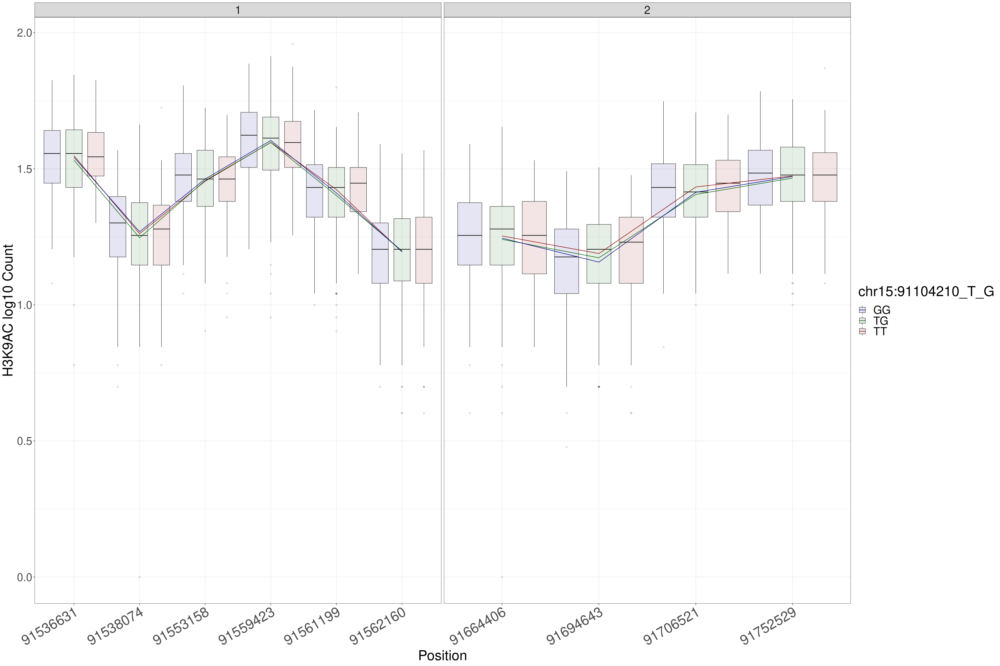

In [198]:
median_plot2+facet_grid(.~group,scale = "free")

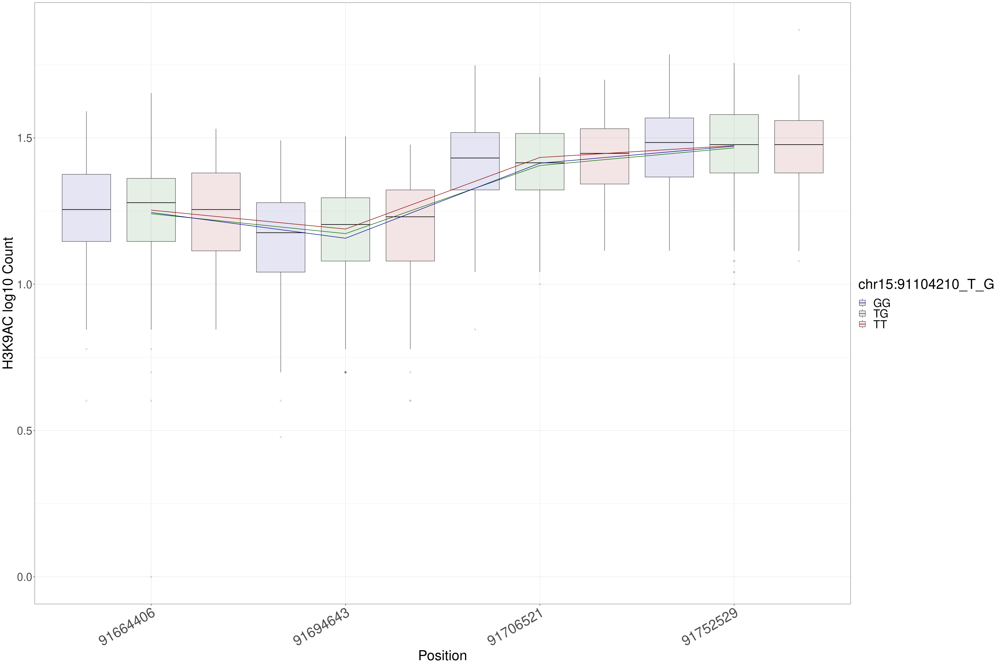

In [183]:
median_plot1

In [184]:
median_plot = h_1217_resid_plot_box%>%filter( )%>%mutate(peak = as.character(peak),peak_pos = as.numeric(peak), count = log10(count),group = case_when(peak_pos%>%within(9.16e+7,9.1675e+7)~1,peak_pos%>%within(9.1675e+7,9.177e+7)~2, .default = 0) )%>%filter(peak_pos%>%within(91590513,91766455) )%>%mutate( `chr15:91104210_T_G` = case_when(X ==0~ "TT", X ==1 ~ "TG", X == 2 ~ "GG" ), peak_pos = as.numeric(peak))%>%
    ggplot(aes(x = peak_pos, color = `chr15:91104210_T_G`, y = count ))+
    #geom_boxplot(aes(x = peak, fill = `chr15:91104210_T_G`, y = count ),position=position_dodge(1), size = 0.3,color = "black" , alpha = 0.1)+
    stat_summary(fun=mean, geom="line", aes(group = X ,color = `chr15:91104210_T_G`,x = peak_pos),size = 0.5)+#facet_grid(.~group,scale = "free_y") +
    geom_point(aes( x = peak_pos, y = 0), color = "red", size = 4 )+
    theme_bw()+theme(text = element_text(size = 30),panel.background = element_rect(), axis.text.x =  element_text(angle = 30,  hjust=1,size = 30))+
    xlab("")+ylab("H3K9AC log10 Count")+ xlab("Position")+scale_fill_discrete(type = c("darkblue","darkgreen","darkred"))+scale_color_discrete(type = c("darkblue","darkgreen","darkred"))+  scale_x_discrete(breaks = function(x){x[c(TRUE, T)]})

New names:
• `` -> `...1`
Warning message:
“Removed 1 rows containing non-finite values (`stat_summary()`).”
Warning message:
“Removed 1 rows containing non-finite values (`stat_boxplot()`).”
Warning message:
“Removed 1 rows containing non-finite values (`stat_summary()`).”


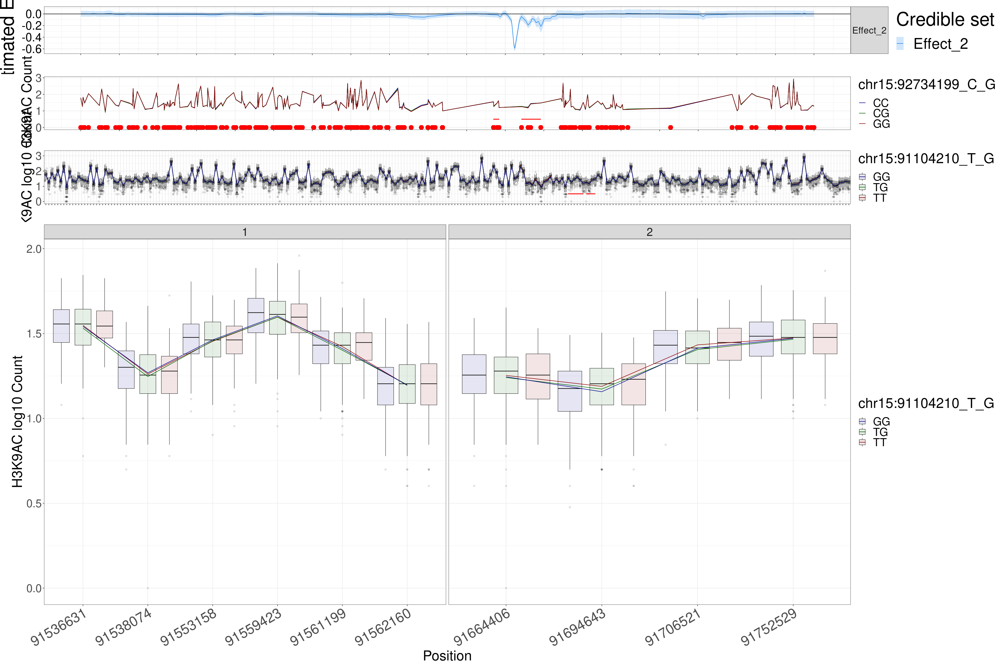

In [207]:
cowplot::plot_grid(plotlist = list(effect_extract_df(Rda1$tad1217_5,2)%>%plot_effect+  scale_x_continuous(breaks = seq(plot_range[1],plot_range[2],length.out = 20), limits = plot_range)+theme(axis.text = element_blank()) ,
                                   median_plot+  scale_x_continuous(breaks = seq(plot_range[1],plot_range[2],length.out = 20), limits = plot_range)+geom_segment(aes(x = 91536631, xend = 91562160, y = 0.5, yend = 0.5 ), color = "red")+

                                   geom_segment(aes(x = 91664406, xend = 91752529, y = 0.5, yend = 0.5 ), color = "red")+theme(axis.text.x = element_blank())+xlab(""), 
median_plot1+geom_segment(aes(x = "91536631", xend = "91562160", y = 0.5, yend = 0.5 ), color = "red")+
                          geom_segment(aes(x = "91664406", xend = "91752529", y = 0.5, yend = 0.5 ), color = "red" )+xlab("")+theme(axis.text.x = element_blank()) ,median_plot2+facet_grid(.~group,scale = "free")
                                   
                                  
                                  
                                  ),ncol = 1, align = "v",axis = "tlbr",rel_heights = c(1,1,1,6)) 